In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import networkx as nx
from networkx.algorithms import bipartite
from tqdm.notebook import tqdm

from system_fns import ArticleEntityAnalysis

import imageio


In [3]:
df = pd.read_csv('business.csv')
df.head()

,id,date,date_gmt,modified,modified_gmt,slug,status,type,link,featured_media,...,_links.replies,_links.version-history,_links.predecessor-version,_links.wp:featuredmedia,_links.wp:attachment,_links.wp:term,_links.curies,content.cleaned,unique_entities,author.name
0,2452759,2023-07-24 10:44:42,2023-07-24T02:44:42,2023-07-24T10:44:46,2023-07-24T02:44:46,repower-energy-initial-public-offering-july-24...,publish,post,https://www.rappler.com/business/repower-energ...,2452801,...,"[{'embeddable': True, 'href': 'https://www.rap...","[{'count': 6, 'href': 'https://www.rappler.com...","[{'id': 2452843, 'href': 'https://www.rappler....","[{'embeddable': True, 'href': 'https://www.rap...",[{'href': 'https://www.rappler.com/wp-json/wp/...,"[{'taxonomy': 'category', 'embeddable': True, ...","[{'name': 'wp', 'href': 'https://api.w.org/{re...","MANILA, Philippines - Repower Energy Developm...","['Eric Peter Roxas', 'Rodrigo Duterte']",Ralf Rivas
1,2451576,2023-07-22 11:20:47,2023-07-22T03:20:47,2023-07-22T11:33:03,2023-07-22T03:33:03,land-transportation-office-driving-schools-lac...,publish,post,https://www.rappler.com/business/land-transpor...,1573391,...,"[{'embeddable': True, 'href': 'https://www.rap...","[{'count': 10, 'href': 'https://www.rappler.co...","[{'id': 2451630, 'href': 'https://www.rappler....","[{'embeddable': True, 'href': 'https://www.rap...",[{'href': 'https://www.rappler.com/wp-json/wp/...,"[{'taxonomy': 'category', 'embeddable': True, ...","[{'name': 'wp', 'href': 'https://api.w.org/{re...","MANILA, Philippines - More than 66% of drivin...","['Edgar Galvante', 'Rodrigo Duterte']",NaN
2,2450569,2023-07-21 09:55:00,2023-07-21T01:55:00,2023-07-21T11:10:08,2023-07-21T03:10:08,updates-global-stock-markets-currencies-oil-pr...,publish,post,https://www.rappler.com/business/updates-globa...,2450578,...,"[{'embeddable': True, 'href': 'https://www.rap...","[{'count': 1, 'href': 'https://www.rappler.com...","[{'id': 2450580, 'href': 'https://www.rappler....","[{'embeddable': True, 'href': 'https://www.rap...",[{'href': 'https://www.rappler.com/wp-json/wp/...,"[{'taxonomy': 'category', 'embeddable': True, ...","[{'name': 'wp', 'href': 'https://api.w.org/{re...","NEW YORK, USA - The dollar rallied and a gaug...","['Ben Jeffery', 'Colin Graham', 'Daleep Singh']",NaN
3,2450555,2023-07-21 09:30:00,2023-07-21T01:30:00,2023-07-21T10:54:10,2023-07-21T02:54:10,india-imposes-major-rice-export-ban-july-2023,publish,post,https://www.rappler.com/business/india-imposes...,2450558,...,"[{'embeddable': True, 'href': 'https://www.rap...","[{'count': 1, 'href': 'https://www.rappler.com...","[{'id': 2450563, 'href': 'https://www.rappler....","[{'embeddable': True, 'href': 'https://www.rap...",[{'href': 'https://www.rappler.com/wp-json/wp/...,"[{'taxonomy': 'category', 'embeddable': True, ...","[{'name': 'wp', 'href': 'https://api.w.org/{re...","NEW DELHI, India - India on Thursday, July 20...","['Narendra Modi', 'BV Krishna Rao']",NaN
4,2450039,2023-07-20 12:37:47,2023-07-20T04:37:47,2023-07-20T12:37:51,2023-07-20T04:37:51,dennis-uy-ph-resorts-group-forced-share-sec-bl...,publish,post,https://www.rappler.com/business/dennis-uy-ph-...,1688238,...,"[{'embeddable': True, 'href': 'https://www.rap...","[{'count': 10, 'href': 'https://www.rappler.co...","[{'id': 2450091, 'href': 'https://www.rappler....","[{'embeddable': True, 'href': 'https://www.rap...",[{'href': 'https://www.rappler.com/wp-json/wp/...,"[{'taxonomy': 'category', 'embeddable': True, ...","[{'name': 'wp', 'href': 'https://api.w.org/{re...","MANILA, Philippines - Dennis Uy's embattled r...","['Dennis Uy', 'Raymundo Martin Escalona']",NaN


In [8]:
df = pd.read_csv('business.csv')
df = df[['date', 'id', 'unique_entities']]
df['date'] = pd.to_datetime(df['date']).dt.date
df['unique_entities'] = [eval(l) for l in df['unique_entities']]
df = df.sort_values('date')
df.head()

,date,id,unique_entities
816,2023-01-01,2191765,"[Jaime Bautista, Bongbong Marcos, Manuel Tamay..."
815,2023-01-02,2191867,"[Manny Pangilinan, Jaime Bautista]"
814,2023-01-02,2192002,"[Jaime Bautista, Rodrigo Duterte, Manuel Tamay..."
811,2023-01-03,2192961,"[Bongbong Marcos, Rodrigo Duterte]"
813,2023-01-03,2192645,"[Ben Lee, Alidad Tash]"


In [4]:
entities = []
for e in df['unique_entities']:
    entities += eval(e)
print('There are', df['id'].nunique(), 'unique news articles.')
print('There are', len(entities), 'mentions of unique entities.')
print('There are', len(np.unique(entities)), 'unique entities.')

There are 817 unique news articles.
There are 3476 mentions of unique entities.
There are 2073 unique entities.


In [9]:
whole = ArticleEntityAnalysis(df)



In [15]:
import imageio

In [66]:
def element_rolling_window_degree_analysis(self, p=5, window_size=7,
                                               kind='entity', plot=False):
    current_date = self.start_date
    
    results = {}
    
    while current_date <= self.end_date:
        cut = self.df[
            (self.df['date'] >= current_date) &
            (self.df['date'] <
                    current_date + pd.Timedelta(days=window_size))
        ]
        bipartite = self._create_bipartite_network(df=cut)
        try:
            projection = self.convert_to_projection(B=bipartite, kind=kind)
            weighted_degree_dict = dict(projection.degree(weight='weight'))
            for value, degree in weighted_degree_dict.items():
                if value not in results:
                    results[value] = []
                results[value].append((pd.Timestamp(current_date), degree))
        except:
            pass

        current_date += timedelta(1)
        
    all_dates = pd.date_range(self.start_date, self.end_date)
    for value in results:
        existing_dates = {date for date, _ in results[value]}
        missing_dates = set(all_dates) - existing_dates
        for missing_date in missing_dates:
            results[value].append((pd.Timestamp(missing_date), 0))
        results[value].sort()
    
    max_degree_elems = sorted(results,
                                key=lambda x: max([degree for _, degree in
                                                    results[x]]),
                                reverse=True)
    top_p_elems = max_degree_elems[:p]
    
    if plot:
        # Fetch default matplotlib colors
        default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
        color_dict = {value: color for value, color in
                        zip(top_p_elems, default_colors)}

        filenames = []

        plt.figure(figsize=(8, 6))
        for index, focus_elem in enumerate(top_p_elems):

            line_handles = []
            line_labels = []

            # Plot all entities in background, including the focused
            # element
            for elem in top_p_elems:
                values = results[elem]
                dates, degrees = zip(*values)
                # if elem != focus_elem:
                #     line, = plt.plot(dates, degrees, '-',
                #                         color='lightgray', alpha=0.6)
                # else:
                line, = plt.plot(dates, degrees, '-',
                                    color=color_dict[elem],
                                    # linewidth=2.5
                                    )
                line_handles.append(line)
                line_labels.append(elem)

            # Replot the focused entity to ensure it's in the foreground
            values = results[focus_elem]
            dates, degrees = zip(*values)
            plt.plot(dates, degrees, '-', linewidth=2.5,
                        color=color_dict[focus_elem])

        plt.ylabel("Weighted Degree")
        plt.xlabel("Date")
        plt.legend(line_handles, line_labels, loc='upper left')
        plt.tight_layout()
        filename = f"{focus_elem}_plot.png"
        plt.savefig(f'top-{p}-entities-in-{window_size}-day-windows.png', dpi=150)
        filenames.append(filename)
        plt.close()

        # # Create GIF
        # with imageio.get_writer(f'{kind}_progression.gif', mode='I',
        #                         duration=1) as writer:
        #     for filename in filenames:
        #         image = imageio.imread(filename)
        #         writer.append_data(image)

In [26]:
whole.element_rolling_window_degree_analysis(window_size=30)

In [69]:
element_rolling_window_degree_analysis(whole, window_size=30, plot=True)

In [58]:
zz
B = zz
nodes = {n for n, d in B.nodes(data=True)
            if d['bipartite'] == kind}

# nx.bipartite.weighted_projected_graph(B, nodes)

In [59]:
nodes

set()

## Entities linked by Existence in Articles

In [5]:
df['unique_entities']

0                ['Eric Peter Roxas', 'Rodrigo Duterte']
1                  ['Edgar Galvante', 'Rodrigo Duterte']
2        ['Ben Jeffery', 'Colin Graham', 'Daleep Singh']
3                    ['Narendra Modi', 'BV Krishna Rao']
4              ['Dennis Uy', 'Raymundo Martin Escalona']
                             ...                        
812    ['Leandro Leviste', 'Enrique Razon Jr', 'Manny...
813                           ['Ben Lee', 'Alidad Tash']
814    ['Jaime Bautista', 'Rodrigo Duterte', 'Manuel ...
815               ['Manny Pangilinan', 'Jaime Bautista']
816    ['Jaime Bautista', 'Bongbong Marcos', 'Manuel ...
Name: unique_entities, Length: 817, dtype: object

In [30]:
# Create an empty graph
B = nx.Graph()

# Add nodes with the node attribute "bipartite"
B.add_nodes_from(df['id'], article=1)  # Add article nodes
# All entities from the 'unique_entities' column
all_entities = [entity for sublist in df['unique_entities'] for entity in eval(sublist)]
B.add_nodes_from(set(all_entities), article=0)  # Add entity nodes

# Add edges between articles and entities
for index, row in tqdm(df.iterrows()):
    article_id = row['id']
    entities = eval(row['unique_entities'])
    for entity in entities:
        B.add_edge(article_id, entity)

NameError: name 'tqdm' is not defined

In [7]:
all_entities

['Eric Peter Roxas',
 'Rodrigo Duterte',
 'Edgar Galvante',
 'Rodrigo Duterte',
 'Ben Jeffery',
 'Colin Graham',
 'Daleep Singh',
 'Narendra Modi',
 'BV Krishna Rao',
 'Dennis Uy',
 'Raymundo Martin Escalona',
 'Bongbong Marcos',
 'Arsenio Balisacan',
 'Jaime Bautista',
 'Josephine Gotianun-Yap',
 'Kees Huizinga',
 'Denys Marchuk',
 'Rishi Sunak',
 'Dominic Johnson',
 'N Chandrasekaran',
 'Jeremy Hunt',
 'Andy Palmer',
 'Ramzan Kadyrov',
 'Vladimir Putin',
 'Yakub Zakriev',
 'Akhmed Dudayev',
 'Ramzan Akhmatovich Kadyrov',
 'Akhmad Kadyrov',
 'Chris Weafer',
 'Yuri Kovalchuk',
 'Mikhail Kovalchuk',
 'Taimuraz Bolloev',
 'Lars Lokke Rasmussen',
 'Arsenio Balisacan',
 'Jaime Bautista',
 'Jaime Bautista',
 'Rodrigo Duterte',
 'Emory Hernandez Valadez',
 'Erik Haas',
 'Anna Camacho',
 'Michael Kaplan',
 'Jimmy Chang',
 'Fiona Cincotta',
 'Will Compernolle',
 'Shannon Seery',
 'Bill Adams',
 'David Russell',
 'Andrew Hollenhorst',
 'Patrick Quayle',
 'Bryan Co',
 'Teofilo Guadiz III',
 'Bon

## Network Visualization

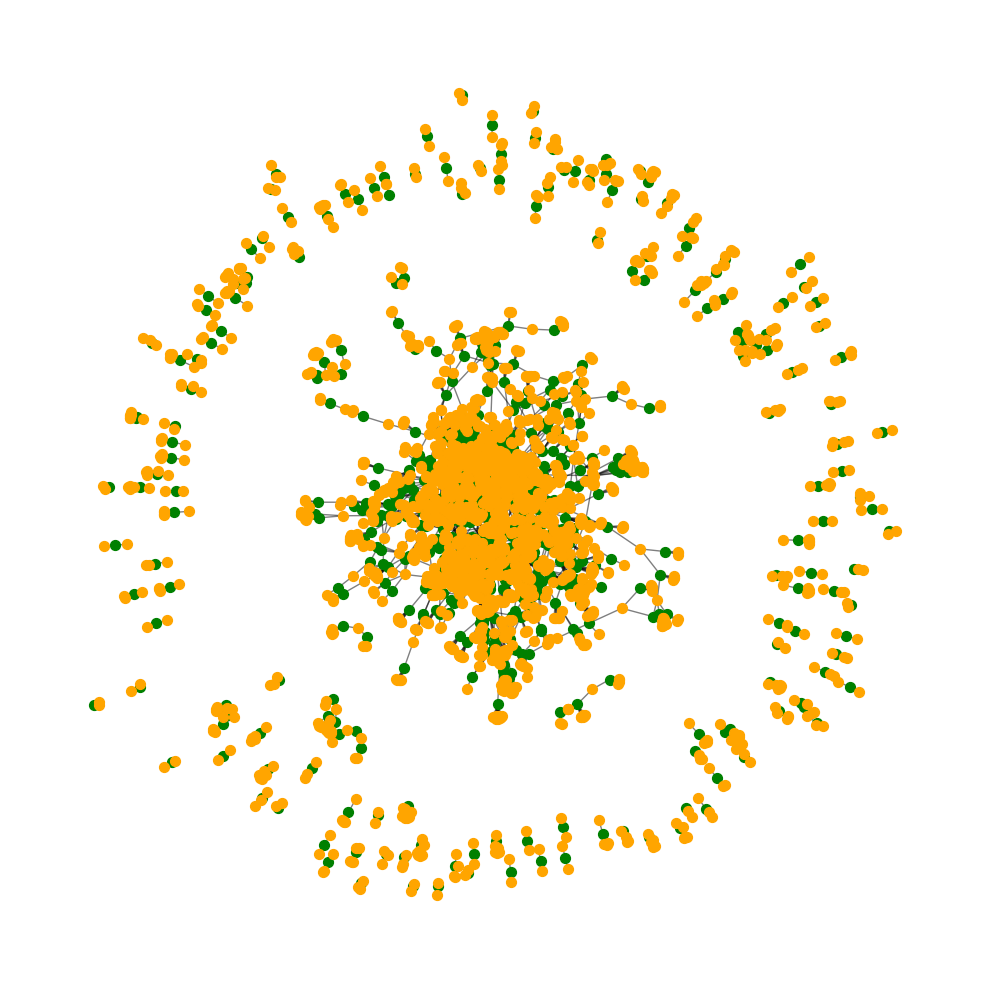

In [9]:
# Determine the nodes for each partition based on the 'bipartite' attribute
article_nodes = [n for n, d in B.nodes(data=True) if d['article']==1]
entity_nodes = [n for n, d in B.nodes(data=True) if d['article']==0]

# Create the bipartite layout
pos = nx.spring_layout(B, seed=34)

# Draw the graph
plt.figure(figsize=(10,10))

# Nodes
nx.draw_networkx_nodes(B, pos, nodelist=article_nodes, node_color='green', node_size=50)
nx.draw_networkx_nodes(B, pos, nodelist=entity_nodes, node_color='orange', node_size=50)

# Edges
nx.draw_networkx_edges(B, pos, width=1, alpha=0.5)  # added alpha for transparency

# If you want to show labels, uncomment the following line. Given the bipartite nature, it might clutter the visualization.
# nx.draw_networkx_labels(B, pos, font_size=12, font_family='sans-serif')

plt.axis('off')
plt.tight_layout()
plt.savefig('bipartite_graph.png', dpi=100)
plt.show()


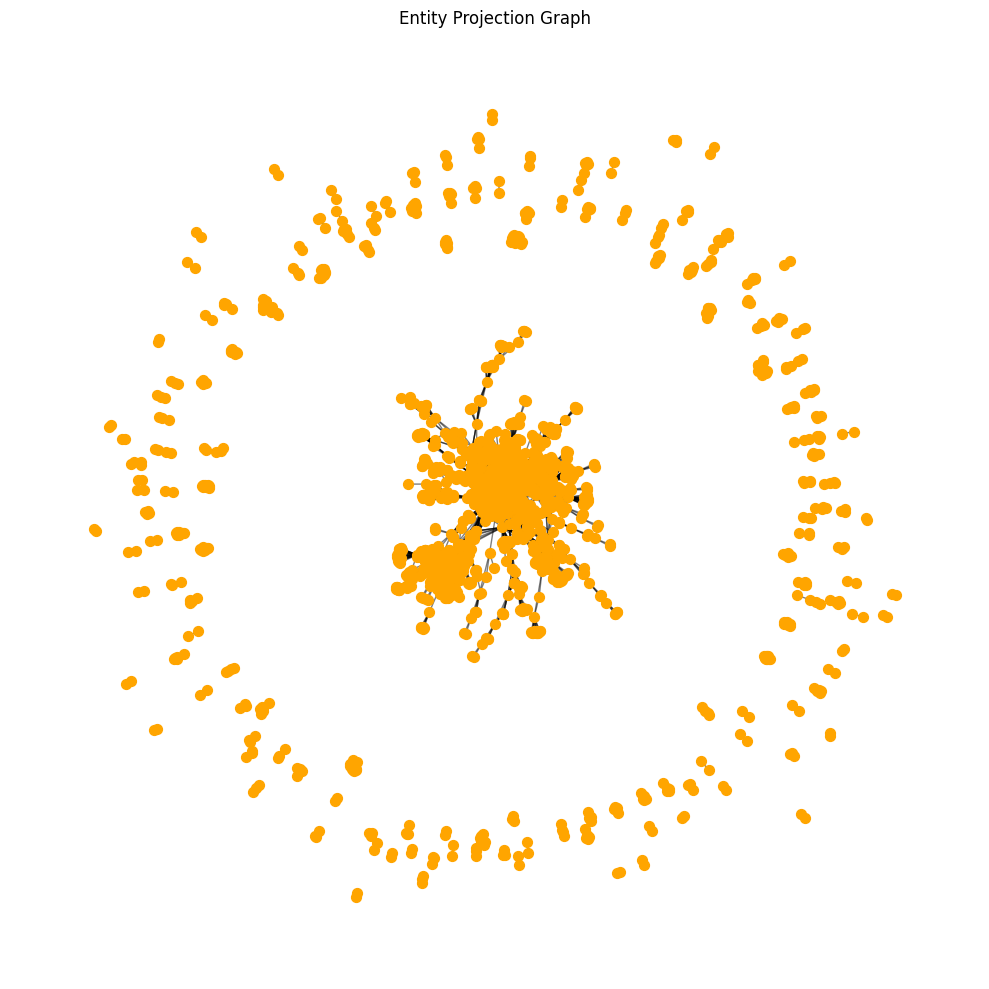

In [10]:
# 1. Create the entity projection
# Project the bipartite graph onto the entities nodes
entity_projection = nx.bipartite.projected_graph(B, entity_nodes)

# 2. Visualize the entity projection graph
# Use the spring layout for positioning
pos = nx.spring_layout(entity_projection, seed=34)

plt.figure(figsize=(10,10))

# Draw nodes and edges
nx.draw_networkx_nodes(entity_projection, pos, node_color='orange', node_size=50)
nx.draw_networkx_edges(entity_projection, pos, alpha=0.5)

# Labels can be added if desired, but with many nodes, it might be cluttered.
# If you want to show labels for specific important nodes or all nodes, you can uncomment the following line.
# nx.draw_networkx_labels(entity_projection, pos, font_size=10, font_family='sans-serif')

plt.title("Entity Projection Graph")
plt.axis('off')
plt.tight_layout()
plt.savefig('entity_projection_graph.png', dpi=100)
plt.show()


In [11]:
# Sort nodes by degree in descending order
sorted_degree = sorted(dict(entity_projection.degree()).items(), key=lambda item: item[1], reverse=True)

# Get the top 10 nodes and their degrees
top_10_degree = sorted_degree[:10]

# Convert to a pandas DataFrame
df_top_10 = pd.DataFrame(top_10_degree, columns=['Node', 'Degree'])

df_top_10

,Node,Degree
0,Joe Biden,192
1,Bongbong Marcos,177
2,Janet Yellen,148
3,Jerome Powell,107
4,Rodrigo Duterte,90
5,Donald Trump,71
6,Martin Romualdez,68
7,Manny Pangilinan,66
8,Kevin McCarthy,63
9,Jamie Dimon,60


In [12]:
# 2. Clustering Coefficient
clustering_coefficient = nx.clustering(entity_projection)
print(f"Average Clustering Coefficient: {nx.average_clustering(entity_projection)}")

# not interesting since all entities appearing in a single article will surely have 1

Average Clustering Coefficient: 0.8156055380489782


In [13]:
# Sort nodes by degree centrality in descending order
sorted_degree_centrality = sorted(nx.degree_centrality(entity_projection).items(), key=lambda item: item[1], reverse=True)

# Get the top 10 nodes and their degree centralities
top_10_degree_centrality = sorted_degree_centrality[:10]

# Convert to a pandas DataFrame
df_top_10_degree_centrality = pd.DataFrame(top_10_degree_centrality, columns=['Node', 'Degree Centrality'])

df_top_10_degree_centrality

,Node,Degree Centrality
0,Joe Biden,0.092664
1,Bongbong Marcos,0.085425
2,Janet Yellen,0.071429
3,Jerome Powell,0.051641
4,Rodrigo Duterte,0.043436
5,Donald Trump,0.034266
6,Martin Romualdez,0.032819
7,Manny Pangilinan,0.031853
8,Kevin McCarthy,0.030405
9,Jamie Dimon,0.028958


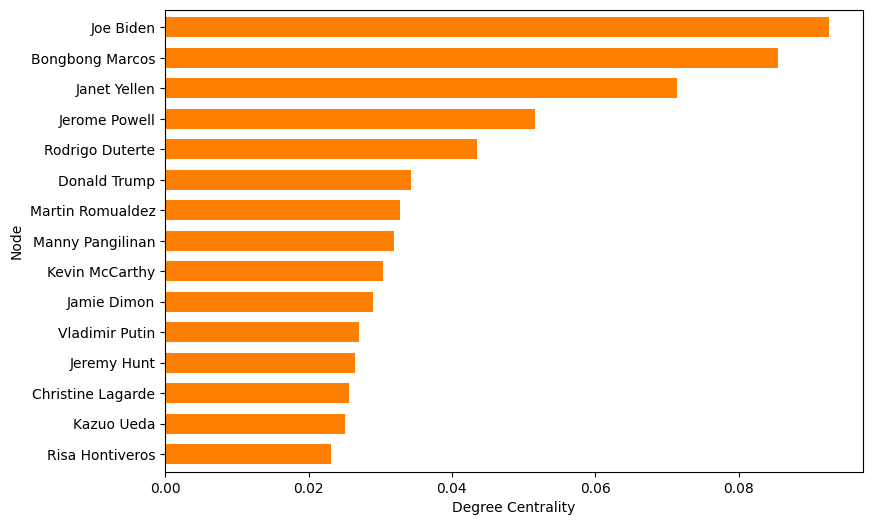

In [138]:
# Sort nodes by degree centrality in descending order
sorted_degree_centrality = sorted(nx.degree_centrality(entity_projection).items(), key=lambda item: item[1], reverse=True)

# Get the top 10 nodes and their degree centralities
top_15_degree_centrality = sorted_degree_centrality[:15]

# Convert to a pandas DataFrame
df_top_15_degree_centrality = pd.DataFrame(top_15_degree_centrality, columns=['Node', 'Degree Centrality'])

df_top_15_degree_centrality

plt.figure(figsize=(9, 6))
df_top_15_degree_centrality.set_index('Node').squeeze().sort_values().plot.barh(width=0.65,
                                                              color='#ff7f00')
plt.xlabel('Degree Centrality')
plt.savefig('top-15-personalities-bar-chart-by-degree-centrality.png')

In [14]:
# Sort nodes by closeness centrality in descending order
sorted_closeness_centrality = sorted(
    nx.closeness_centrality(entity_projection).items(),
    key=lambda item: item[1],
    reverse=True
)

# Get the top 10 nodes and their closeness centralities
top_10_closeness_centrality = sorted_closeness_centrality[:10]

# Convert to a pandas DataFrame
df_top_10_closeness = pd.DataFrame(top_10_closeness_centrality, columns=['Node', 'Closeness Centrality'])

df_top_10_closeness

,Node,Closeness Centrality
0,Joe Biden,0.293363
1,Janet Yellen,0.263426
2,Donald Trump,0.257127
3,Bongbong Marcos,0.251363
4,Xi Jinping,0.245910
5,Rodrigo Duterte,0.245044
6,Jerome Powell,0.244126
7,Kazuo Ueda,0.235206
8,Leni Robredo,0.233993
9,"Benigno ""Ninoy"" Aquino Jr",0.233835


In [15]:
# Sort nodes by betweenness centrality in descending order
sorted_betweenness_centrality = sorted(
    nx.betweenness_centrality(entity_projection).items(),
    key=lambda item: item[1],
    reverse=True)

# Get the top 10 nodes and their betweenness centralities
top_10_betweenness_centrality = sorted_betweenness_centrality[:10]

# Convert to a pandas DataFrame
df_top_10_betweenness = pd.DataFrame(top_10_betweenness_centrality, columns=['Node', 'Betweenness Centrality'])

df_top_10_betweenness

,Node,Betweenness Centrality
0,Joe Biden,0.232528
1,Bongbong Marcos,0.132956
2,Janet Yellen,0.092811
3,Jerome Powell,0.063736
4,Donald Trump,0.056927
5,Rodrigo Duterte,0.052626
6,Xi Jinping,0.041473
7,Narendra Modi,0.041366
8,Vladimir Putin,0.032152
9,Jamie Dimon,0.029767


In [16]:
# 6. Density
density = nx.density(entity_projection)
print(f"Density: {density}")

Density: 0.0033855956431933275


## Articles linked by Similar Entities

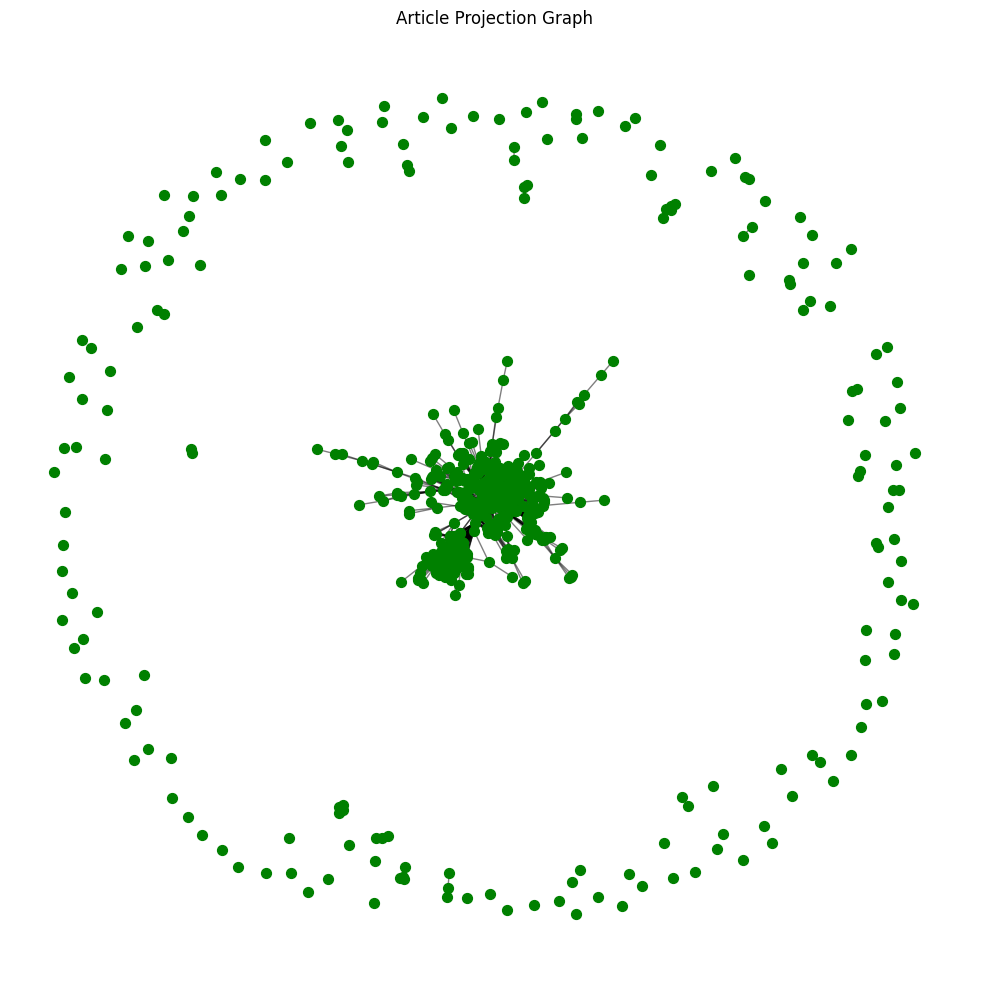

In [17]:
# 1. Create the article projection
# Project the bipartite graph onto the article nodes
article_projection = nx.bipartite.projected_graph(B, article_nodes)

# 2. Visualize the article projection graph
# Use the spring layout for positioning
pos = nx.spring_layout(article_projection, seed=34)

plt.figure(figsize=(10,10))

# Draw nodes and edges
nx.draw_networkx_nodes(article_projection, pos, node_color='green', node_size=50)
nx.draw_networkx_edges(article_projection, pos, alpha=0.5)

# Labels can be added if desired, but with many nodes, it might be cluttered.
# If you want to show labels for specific important nodes or all nodes, you can uncomment the following line.
# nx.draw_networkx_labels(article_projection, pos, font_size=10, font_family='sans-serif')

plt.title("Article Projection Graph")
plt.axis('off')
plt.tight_layout()
plt.savefig('article_projection_graph.png', dpi=100)
plt.show()

In [6]:
df['article_title'] = df['link'].str.split('/').apply(lambda x: x[-2])

In [19]:
# Sort nodes by degree in descending order
sorted_degree = sorted(
    dict(article_projection.degree()).items(),
    key=lambda item: item[1],
    reverse=True
)

# Get the top 10 nodes and their degrees
top_10_degree = sorted_degree[:10]

# Convert to a pandas DataFrame
df_top_10 = pd.DataFrame(top_10_degree,
                         columns=['Node', 'Degree'])

df_top_10['titles'] = df.set_index("id")['article_title'].loc[
    df_top_10.Node
].tolist()

df_top_10

,Node,Degree,titles
0,2276457,181,artificial-intelligence-race-canva-draws-line-...
1,2258943,173,united-states-joe-biden-says-banking-crisis-ca...
2,2256492,168,how-washington-scrambled-silicon-valley-bank-c...
3,2301210,160,g7-finance-ministers-central-bank-governors-me...
4,2292488,159,united-states-federal-reserve-jerome-powell-re...
5,2254253,147,united-states-preparing-stem-silicon-valley-ba...
6,2300876,142,janet-yellen-hopeful-solution-united-states-de...
7,2299546,142,united-states-debt-standoff-overshadows-g7-fin...
8,2267894,142,united-states-white-house-pushes-new-rules-mid...
9,2205520,137,united-states-janet-yellen-china-liu-he-meetin...


In [20]:
# 2. Clustering Coefficient
clustering_coefficient = nx.clustering(article_projection)
print(f"Average Clustering Coefficient: {nx.average_clustering(article_projection)}")

# not interesting since all entities appearing in a single article will surely have 1

Average Clustering Coefficient: 0.5854492345445225


In [21]:
# Sort nodes by degree centrality in descending order
sorted_degree_centrality = sorted(
    nx.degree_centrality(article_projection).items(),
    key=lambda item: item[1],
    reverse=True
)

# Get the top 10 nodes and their degree centralities
top_10_degree_centrality = sorted_degree_centrality[:10]

# Convert to a pandas DataFrame
df_top_10_degree_centrality = pd.DataFrame(top_10_degree_centrality, columns=['Node', 'Degree Centrality'])

df_top_10_degree_centrality['titles'] = df.set_index("id")['article_title'].loc[
    df_top_10_degree_centrality.Node
].tolist()

df_top_10_degree_centrality

,Node,Degree Centrality,titles
0,2276457,0.221814,artificial-intelligence-race-canva-draws-line-...
1,2258943,0.212010,united-states-joe-biden-says-banking-crisis-ca...
2,2256492,0.205882,how-washington-scrambled-silicon-valley-bank-c...
3,2301210,0.196078,g7-finance-ministers-central-bank-governors-me...
4,2292488,0.194853,united-states-federal-reserve-jerome-powell-re...
5,2254253,0.180147,united-states-preparing-stem-silicon-valley-ba...
6,2300876,0.174020,janet-yellen-hopeful-solution-united-states-de...
7,2299546,0.174020,united-states-debt-standoff-overshadows-g7-fin...
8,2267894,0.174020,united-states-white-house-pushes-new-rules-mid...
9,2205520,0.167892,united-states-janet-yellen-china-liu-he-meetin...


In [22]:
# Sort nodes by closeness centrality in descending order
sorted_closeness_centrality = sorted(
    nx.closeness_centrality(article_projection).items(),
    key=lambda item: item[1],
    reverse=True
)

# Get the top 10 nodes and their closeness centralities
top_10_closeness_centrality = sorted_closeness_centrality[:10]

# Convert to a pandas DataFrame
df_top_10_closeness = pd.DataFrame(top_10_closeness_centrality, columns=['Node', 'Closeness Centrality'])

df_top_10_closeness['titles'] = df.set_index("id")['article_title'].loc[
    df_top_10_closeness.Node
].tolist()

df_top_10_closeness

,Node,Closeness Centrality,titles
0,2276457,0.377907,artificial-intelligence-race-canva-draws-line-...
1,2258943,0.366204,united-states-joe-biden-says-banking-crisis-ca...
2,2256492,0.362915,how-washington-scrambled-silicon-valley-bank-c...
3,2292488,0.358355,united-states-federal-reserve-jerome-powell-re...
4,2301210,0.356510,g7-finance-ministers-central-bank-governors-me...
5,2267894,0.353392,united-states-white-house-pushes-new-rules-mid...
6,2254253,0.351854,united-states-preparing-stem-silicon-valley-ba...
7,2299546,0.351598,united-states-debt-standoff-overshadows-g7-fin...
8,2324417,0.350581,united-states-joe-biden-kevin-mccarthy-meeting...
9,2323759,0.350075,joe-biden-kevin-mccarthy-planned-meeting-unite...


In [23]:
# Sort nodes by betweenness centrality in descending order
sorted_betweenness_centrality = sorted(
    nx.betweenness_centrality(article_projection).items(),
    key=lambda item: item[1],
    reverse=True)

# Get the top 10 nodes and their betweenness centralities
top_10_betweenness_centrality = sorted_betweenness_centrality[:10]

# Convert to a pandas DataFrame
df_top_10_betweenness = pd.DataFrame(top_10_betweenness_centrality, columns=['Node', 'Betweenness Centrality'])

df_top_10_betweenness['titles'] = df.set_index("id")['article_title'].loc[
    df_top_10_betweenness.Node
].tolist()

df_top_10_betweenness

,Node,Betweenness Centrality,titles
0,2276457,0.207361,artificial-intelligence-race-canva-draws-line-...
1,2226280,0.046917,air-india-seals-record-order-airbus-boeing-jet...
2,2299546,0.029198,united-states-debt-standoff-overshadows-g7-fin...
3,2258943,0.025541,united-states-joe-biden-says-banking-crisis-ca...
4,2301210,0.025240,g7-finance-ministers-central-bank-governors-me...
5,2195285,0.024152,is-it-time-philippines-air-traffic-control-be-...
6,2256492,0.020204,how-washington-scrambled-silicon-valley-bank-c...
7,2267894,0.019776,united-states-white-house-pushes-new-rules-mid...
8,2256433,0.016802,united-states-government-statement-saudi-arabi...
9,2259821,0.016344,central-banks-try-calm-markets-after-ubs-deal-...


In [24]:
# 6. Density
density = nx.density(article_projection)
print(f"Density: {density}")

Density: 0.03607471140230878


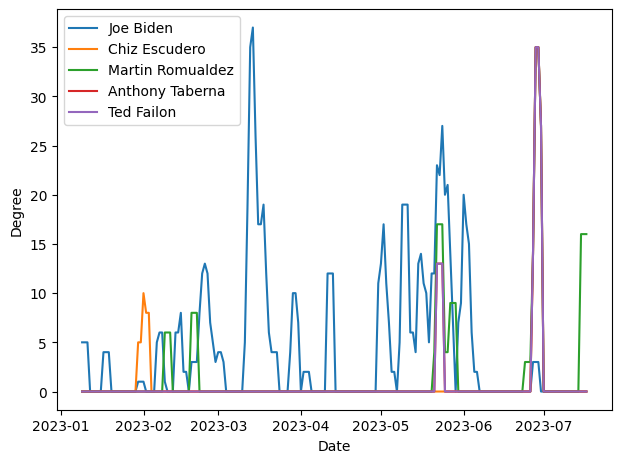

In [94]:
def rolling_window_analysis(df, p, days=7):
    # Convert the 'date' column to datetime if it's not
    df['date'] = pd.to_datetime(df['date'])
    
    start_date = df['date'].min()
    end_date = df['date'].max()
    current_date = start_date
    
    results = {}
    
    while current_date <= end_date:
        # Filter dataframe for the current week
        week_df = df[(df['date'] >= current_date) & (df['date'] < current_date + timedelta(days))]
        
        # Create the bipartite graph
        B = nx.Graph()
        B.add_nodes_from(week_df['id'], bipartite=0)
        entities = [entity for sublist in week_df['unique_entities'] for entity in eval(sublist)]
        B.add_nodes_from(set(entities), bipartite=1)
        for _, row in week_df.iterrows():
            for entity in eval(row['unique_entities']):
                B.add_edge(row['id'], entity)
        
        # Project the bipartite graph
        entity_nodes = {n for n, d in B.nodes(data=True) if d['bipartite'] == 1}
        entity_projection = nx.bipartite.projected_graph(B, entity_nodes)
        
        # Calculate the degree
        degree_dict = dict(entity_projection.degree())
        for entity, degree in degree_dict.items():
            if entity not in results:
                results[entity] = []
            results[entity].append((current_date, degree))
        
        # Move to the next day
        current_date += timedelta(1)
    
    # Sort entities by their maximum degree achieved in any week
    max_degree_entities = sorted(results, key=lambda x: max([degree for _, degree in results[x]]), reverse=True)
    
    # Consider only the top p entities
    top_p_entities = max_degree_entities[:p]
    # Plotting
    plt.figure(figsize=(12/1.9, 9/1.9))
    
    start_dates = []
    end_dates = []
    for entity in top_p_entities:
        values = results[entity]
        dates, degrees = zip(*values)

        df = pd.DataFrame({'Date': dates, 'Value': degrees})
        
        start_dates.append(df['Date'].min())
        end_dates.append(df['Date'].max())
    
    for entity in top_p_entities:
        values = results[entity]
        dates, degrees = zip(*values)

        df = pd.DataFrame({'Date': dates, 'Value': degrees})
    
        all_dates = pd.date_range(start=min(start_dates), end=max(end_dates),
                                  freq='D')
        df = df.set_index('Date').reindex(all_dates).fillna(0).reset_index()
        plt.plot(df['index'], df['Value'], '-',# marker='o', markersize=3,
                 label=entity)
    
    plt.ylabel("Degree")
    plt.xlabel("Date")
    # plt.title(f"Top {p} entities' degree progression over time")
    plt.legend(loc='best',# bbox_to_anchor=(1,1),
               ncol=1)
    plt.tight_layout()
    plt.savefig(f'top-{p}-entities-in-{days}-day-windows.png')

rolling_window_analysis(df, 5, 3)

## Topic Modeling

In [4]:
import pandas as pd
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from gensim import corpora, models
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

In [7]:
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def clean_title(title):
    words = title.split('-')
    words = [word for word in words if word not in stop_words]
    words = [word for word in words if not word.isdigit()]
    words = [lemmatizer.lemmatize(word) for word in words]
    return words

df['cleaned_titles'] = df['article_title'].apply(clean_title)

In [8]:
# Create a dictionary and corpus required for LDA
dictionary = corpora.Dictionary(df['cleaned_titles'])
corpus = [dictionary.doc2bow(text) for text in df['cleaned_titles']]

# Apply LDA model
lda_model = models.LdaModel(corpus, num_topics=6, id2word=dictionary, passes=20)  # Assuming 5 topics; adjust as needed

topics = lda_model.print_topics(num_words=10)  # Top 5 words for each topic
for topic in topics:
    print(topic)

(0, '0.008*"may" + 0.008*"marcos" + 0.008*"deal" + 0.007*"fund" + 0.007*"ukraine" + 0.007*"investment" + 0.007*"grain" + 0.007*"jr" + 0.006*"britain" + 0.006*"say"')
(1, '0.042*"price" + 0.040*"global" + 0.038*"stock" + 0.036*"oil" + 0.035*"market" + 0.032*"update" + 0.032*"currency" + 0.015*"february" + 0.013*"may" + 0.013*"april"')
(2, '0.013*"march" + 0.010*"bank" + 0.009*"world" + 0.008*"staff" + 0.007*"forum" + 0.006*"statement" + 0.005*"economic" + 0.005*"fund" + 0.005*"central" + 0.004*"medium"')
(3, '0.015*"report" + 0.015*"earnings" + 0.012*"johnson" + 0.011*"credit" + 0.010*"adani" + 0.009*"april" + 0.009*"share" + 0.009*"february" + 0.008*"suisse" + 0.008*"india"')
(4, '0.012*"suisse" + 0.012*"credit" + 0.010*"ubs" + 0.009*"inflation" + 0.008*"china" + 0.007*"january" + 0.007*"february" + 0.007*"philippine" + 0.007*"economy" + 0.006*"fund"')
(5, '0.056*"united" + 0.052*"state" + 0.029*"bank" + 0.016*"debt" + 0.015*"may" + 0.014*"march" + 0.012*"rate" + 0.010*"federal" + 0.00

In [9]:
# Combine all titles into a list
titles = df['article_title'].tolist()

# Convert the titles to a matrix of TF-IDF features
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(titles)

# Apply NMF model (assuming 5 topics; adjust as needed)
nmf_model = NMF(n_components=15, random_state=1).fit(tfidf)

# Print the top words for each topic
feature_names = tfidf_vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(nmf_model.components_):
    print(f"Topic #{topic_idx + 1}:")
    print(" ".join([feature_names[i] for i in topic.argsort()[:-10 - 1:-1]]))
    print("\n")

Topic #1:
currencies updates markets stock prices oil global 2023 march 22


Topic #2:
states united federal reserve march 2023 consumer jerome powell banks


Topic #3:
earnings report 2022 december january q1 q4 year fiscal 2023


Topic #4:
inflation rate kingdom united 2023 argentina january high unemployment march


Topic #5:
bank valley silicon world collapse banga ajay nominee president svb


Topic #6:
credit suisse ubs march switzerland deal 2023 takeover rescue crisis


Topic #7:
debt ceiling states united joe biden june 2023 kevin mccarthy


Topic #8:
monetary policy rates bank central japan european forecasts march 2023


Topic #9:
china yellen janet lanka luxury sri exports imports march 2023


Topic #10:
group adani india shares january 2023 gautam 30 free share


Topic #11:
february 2023 ukraine turkey world damage 15 britain survey estimate


Topic #12:
fund maharlika investment senate international hearing monetary loan senators 2023


Topic #13:
april 2023 johnson russia

## BERTopic

In [9]:
# Translation
from langdetect import detect_langs, LangDetectException
from googletrans import Translator

import pandas as pd
# from gensim import corpora, models
# from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.tokenize import word_tokenize
import nltk

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import WordPunctTokenizer
from string import punctuation
from sklearn.feature_extraction.text import TfidfVectorizer

# Remove import warnings
import warnings
from numba import NumbaWarning
warnings.filterwarnings("ignore", category=NumbaWarning)

# Topic Modeling
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP
# from cuml.manifold import UMAP # Maximize GPU Utilization
from hdbscan import HDBSCAN
# from cuml.cluster import HDBSCAN # Maximize GPU Utilization
from sklearn.feature_extraction.text import CountVectorizer
# import openai
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance
from bertopic.representation import OpenAI, PartOfSpeech
from collections import defaultdict
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors

In [11]:
# Pre-calculate embeddings
embedding_model = SentenceTransformer("all-mpnet-base-v2")
umap_model = UMAP(n_neighbors=20,
                  n_components=5,
                  min_dist=0.0,
                  metric='cosine',
                  random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=50,
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=True)
vectorizer_model = CountVectorizer(stop_words="english",
                                   min_df=2,
                                   ngram_range=(1, 2))
# KeyBERT
keybert_model = KeyBERTInspired()

# Part-of-Speech
pos_model = PartOfSpeech("en_core_web_lg")

# MMR
mmr_model = MaximalMarginalRelevance(diversity=0.3)

# All representation models
representation_model = {
    "KeyBERT": keybert_model,
    "MMR": mmr_model,
    "POS": pos_model
}

In [12]:
docs2 = df.cleaned_titles.apply(lambda x: ' '.join(x)).tolist()
embeddings = embedding_model.encode(docs2, show_progress_bar=True)

Batches:   0%|          | 0/26 [00:00<?, ?it/s]

In [13]:
topic_model5 = BERTopic(

    # Pipeline models
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    representation_model=representation_model,
    top_n_words=10,
    verbose=True
)

topics5, probs = topic_model5.fit_transform(docs2, embeddings)

2023-12-13 11:22:56,020 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2023-12-13 11:23:19,307 - BERTopic - Dimensionality - Completed ✓
2023-12-13 11:23:19,311 - BERTopic - Cluster - Start clustering the reduced embeddings
2023-12-13 11:23:19,443 - BERTopic - Cluster - Completed ✓
2023-12-13 11:23:19,465 - BERTopic - Representation - Extracting topics from clusters using representation models.
2023-12-13 11:23:21,829 - BERTopic - Representation - Completed ✓


In [14]:
topic_model5.get_topic_info()['Name'].tolist()

['-1_state_united state_united_price',
 '0_philippine_air_jr_marcos',
 '1_inflation_rate_central_bank',
 '2_bank_silicon valley_valley_silicon']

In [15]:
topic_model5.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,MMR,POS,Representative_Docs
0,-1,527,-1_state_united state_united_price,"[state, united state, united, price, oil, glob...","[price april, stock market, march, oil, stock,...","[state, united state, united, price, oil, glob...","[price, oil, global, market, stock, consumer, ...",[update global stock market currency oil price...
1,0,141,0_philippine_air_jr_marcos,"[philippine, air, jr, marcos, marcos jr, july,...","[philippine, marcos jr, marcos, san miguel, mo...","[philippine, air, jr, marcos, marcos jr, july,...","[president, project, day, airline, strike, thi...",[marcos jr visit japan pitch think growth thin...
2,1,96,1_inflation_rate_central_bank,"[inflation, rate, central, bank, central bank,...","[monetary policy, rate hike, inflation fall, p...","[inflation, rate, central, bank, central bank,...","[inflation, rate, central, bank, monetary, mon...",[european central bank monetary policy interes...
3,2,53,2_bank_silicon valley_valley_silicon,"[bank, silicon valley, valley, silicon, valley...","[banking turmoil, valley bank, bank crisis, sv...","[bank, silicon valley, valley, silicon, valley...","[collapse, deposit, risk, hearing, firm, crisi...",[united state preparing stem silicon valley ba...


In [16]:
df['topic'] = topics5
df['topic'] = df.topic.map({0:'russian_ukraine_war',1:'inflation',2:'ph_marcos_jr',3:'covid',4:'ph_gdp',5:'airlines',6:'fuel_oil_market',7:'sri_lanka_crisis',8:'credit_suisse'}).fillna('others')

In [17]:
df.topic.unique()

array(['russian_ukraine_war', 'others', 'inflation', 'ph_marcos_jr'],
      dtype=object)

In [18]:
# Pre-calculate embeddings
umap_model = UMAP(n_neighbors=10,
                  n_components=5,
                  min_dist=0.0,
                  metric='cosine',
                  random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=50,
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=True)
vectorizer_model = CountVectorizer(stop_words="english",
                                   min_df=2,
                                   ngram_range=(1, 2))
# KeyBERT
keybert_model = KeyBERTInspired()

# Part-of-Speech
pos_model = PartOfSpeech("en_core_web_lg")

# MMR
mmr_model = MaximalMarginalRelevance(diversity=0.3)

# All representation models
representation_model = {
    "KeyBERT": keybert_model,
    "MMR": mmr_model,
    "POS": pos_model
}

In [19]:
docs3 = df[df.topic=='others'].cleaned_titles.apply(lambda x: ' '.join(x)).tolist()
embeddings = embedding_model.encode(docs3, show_progress_bar=True)

topic_model5 = BERTopic(

    # Pipeline models
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    representation_model=representation_model,
    top_n_words=10,
    verbose=True
)

topics6, probs = topic_model5.fit_transform(docs3, embeddings)

Batches:   0%|          | 0/17 [00:00<?, ?it/s]

2023-12-13 11:23:30,691 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2023-12-13 11:23:35,594 - BERTopic - Dimensionality - Completed ✓
2023-12-13 11:23:35,595 - BERTopic - Cluster - Start clustering the reduced embeddings
2023-12-13 11:23:35,647 - BERTopic - Cluster - Completed ✓
2023-12-13 11:23:35,652 - BERTopic - Representation - Extracting topics from clusters using representation models.
2023-12-13 11:23:36,707 - BERTopic - Representation - Completed ✓


In [20]:
topic_model5.get_topic_info()['Name'].tolist()

['-1_global_stock_market_oil price',
 '0_earnings_earnings report_report_january',
 '1_ukraine_russia_farmer_russian',
 '2_state_united state_united_debt']

In [21]:
topic_model5.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,MMR,POS,Representative_Docs
0,-1,271,-1_global_stock_market_oil price,"[global, stock, market, oil price, price, stoc...","[oil price, stock market, march, oil, stock, a...","[global, stock, market, oil price, price, stoc...","[global, stock, market, price, oil, suisse, cr...",[update global stock market currency oil price...
1,0,97,0_earnings_earnings report_report_january,"[earnings, earnings report, report, january, b...","[earnings report, earnings, report january, ce...","[earnings, earnings report, report, january, b...","[earnings, report, boeing, q1, fiscal, order, ...","[boeing earnings report q1, bpi earnings repor..."
2,1,86,1_ukraine_russia_farmer_russian,"[ukraine, russia, farmer, russian, oil, onion,...","[opec cut, opec, russia, ukraine, russian, oil...","[ukraine, russia, farmer, russian, oil, onion,...","[farmer, russian, oil, onion, price, cut, outp...",[ukraine say russia preventing operation black...
3,2,73,2_state_united state_united_debt,"[state, united state, united, debt, janet, yel...","[debt ceiling, janet yellen, yellen, yellen sa...","[state, united state, united, debt, janet, yel...","[debt, ceiling, crisis, deal, possible, reacti...",[janet yellen maintains early june united stat...


In [22]:
df2 = df[df.topic=='others']
df2['topic'] = topics6
df2['topic'] = df2.topic.map({-1:'global_market',0:'uk_bugdet_unemployment',1:'ph_gdp'})

In [23]:
df_final = pd.concat([df[df.topic!='others'], df2]).sort_index()
df_final['month'] = pd.to_datetime(df_final.date).dt.strftime('%Y-%m')

In [24]:
df_final.to_csv('business_w_topics.csv', index=False)

## Reload `df_final`

In [3]:
df_final = pd.read_csv('business_w_topics.csv')
df_final.unique_entities = df_final.unique_entities.apply(eval)
df_final.date = pd.to_datetime(df_final.date)
df_final.topic = df_final.topic.fillna('others')

topic_label_map = dict(zip(
    df_final.topic.unique().tolist(),
    [
        'Infra and Transpo Developments',
        'Global Markets',
        'Trade Dynamics',
        'Corporate Affairs',
        'Economic Challenges',
        'Debt',
        'Regulatory Challenges'
        
        # 'Russia-Ukraine War', 'Global Market', 'PH GDP',
        # 'UK Budget Unemployment', 'Inflation', 'Others',
        # 'PH Marcos Jr.'
    ]
))

df_final.topic = df_final.topic.replace(topic_label_map)

In [4]:
df_final.topic.unique()

array(['Infra and Transpo Developments', 'Global Markets',
       'Trade Dynamics', 'Corporate Affairs', 'Economic Challenges',
       'Debt', 'Regulatory Challenges'], dtype=object)

In [5]:
df_final.month

0      2023-07
1      2023-07
2      2023-07
3      2023-07
4      2023-07
        ...   
812    2023-01
813    2023-01
814    2023-01
815    2023-01
816    2023-01
Name: month, Length: 817, dtype: object

In [12]:
import networkx as nx

B = ArticleEntityAnalysis(df_final).B

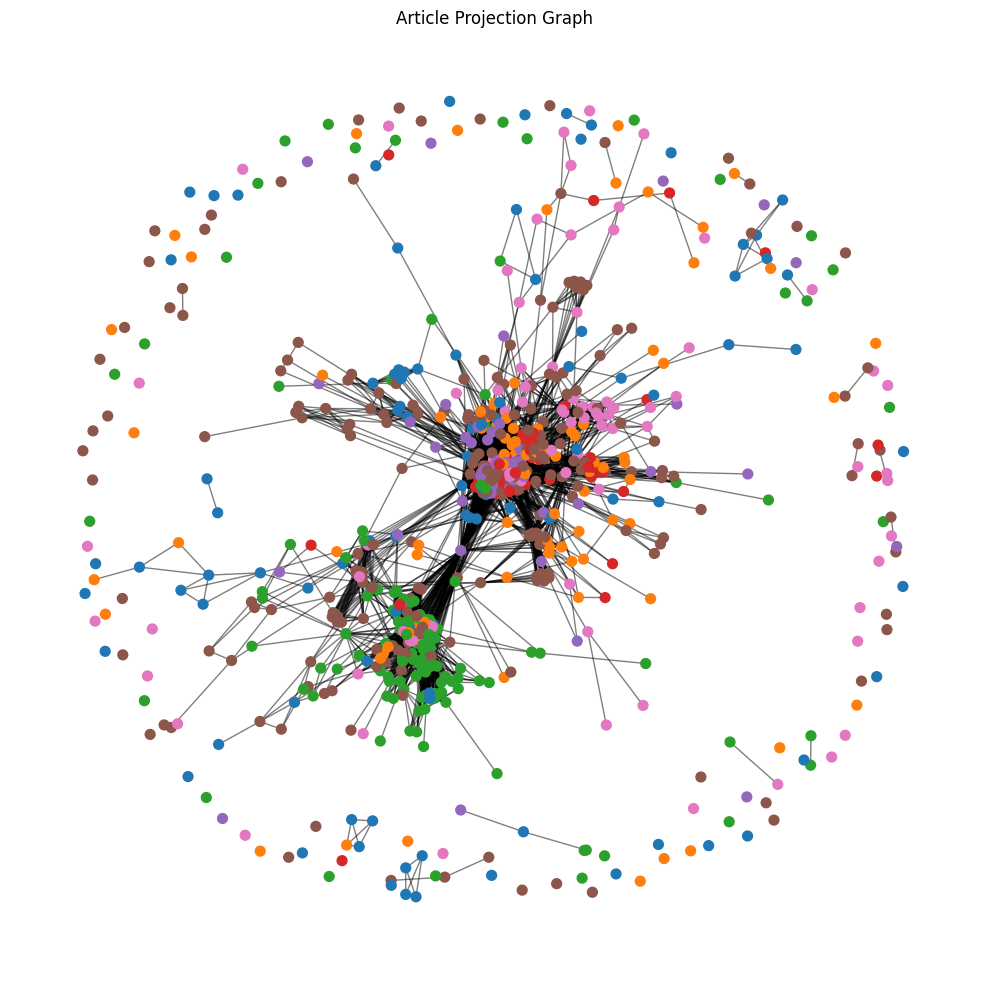

In [13]:
# 1. Create the article projection
# Project the bipartite graph onto the article nodes
m_df = df_final#[df_final.month == '2023-01']
article_nodes = m_df.id.unique().tolist()
labels = pd.Series(df_final.topic.values,index=df_final.id).to_dict()


unique_labels = list(set(labels.values()))
cmap = mcolors.ListedColormap(list(mcolors.TABLEAU_COLORS.values())[:len(unique_labels)], name='allcolors')
label_to_color = {label: cmap.colors[idx] for idx, label in enumerate(unique_labels)}

article_projection = nx.bipartite.projected_graph(B, article_nodes)
node_colors = [label_to_color[labels[node]] for node in article_projection.nodes()]

# 2. Visualize the article projection graph

# Use the spring layout for positioning
pos = nx.spring_layout(article_projection, k=0.12, seed=34)

plt.figure(figsize=(10,10))

# Draw nodes and edges
nx.draw_networkx_nodes(article_projection, pos, node_color=node_colors, cmap=cmap, node_size=50)
nx.draw_networkx_edges(article_projection, pos, alpha=0.5)

# Labels can be added if desired, but with many nodes, it might be cluttered.
# If you want to show labels for specific important nodes or all nodes, you can uncomment the following line.
# nx.draw_networkx_labels(article_projection, pos, font_size=10, font_family='sans-serif')

plt.title("Article Projection Graph")
plt.axis('off')
plt.tight_layout()
plt.show()

In [15]:
article_nodes = [n for n, d in B.nodes(data=True) if d['bipartite']=='article']

In [16]:
def custom_layout(G, labels):
    # Get unique labels and the number of nodes for each label
    unique_labels = list(set(labels.values()))
    
    # Define grid positions for cluster centers
    grid_positions = [(i, j) for i in range(3) for j in range(4)]
    if len(unique_labels) < len(grid_positions):
        grid_positions = grid_positions[:len(unique_labels)]
    
    cluster_centers = {label: pos for label, pos in zip(unique_labels, grid_positions)}

    pos = {}
    for label in unique_labels:
        # Nodes in the current cluster
        cluster_nodes = [node for node, cluster_label in labels.items() if cluster_label == label]
        
        # Use spring layout for nodes within the cluster
        cluster_pos = nx.random_layout(G.subgraph(cluster_nodes))
        
        # Translate the spring layout positions to the cluster's position
        for node, (x, y) in cluster_pos.items():
            pos[node] = (x + cluster_centers[label][0], y + cluster_centers[label][1])

    return pos

def plot_network(m):
    m_df = df_final[df_final.month == m]
    #article_nodes = m_df.id.unique().tolist()
    labels = pd.Series(df_final.topic.values, index=df_final.id).to_dict()

    topic_counts = m_df.topic.value_counts().to_dict()

    # Create a sample graph (replace this with your graph)
    article_projection = nx.bipartite.projected_graph(B, article_nodes)
    article_projection.remove_nodes_from(
        df_final[df_final.month != m]
        .id.tolist())
    article_projection.remove_nodes_from(list(nx.isolates(article_projection)))

    pos = custom_layout(article_projection, labels)

    # Set node colors based on external cluster labels
    unique_labels = list(set(labels.values()))
    color_map = {label: plt.cm.jet(i/len(unique_labels)) for i, label in enumerate(unique_labels)}
    node_colors = [(*color_map[labels[node]][:3], 0.6) for node in article_projection.nodes()]

    plt.figure(figsize=(10, 10))
    nx.draw(article_projection, pos, node_color=node_colors, edge_color=(0.4823529411764706, 0.48627450980392156, 0.48627450980392156,0.5), node_size=500)
    plt.title("Graph with Custom Layout for 11 Clusters")
    patchList = []
    for label, color in color_map.items():
        try:
            data_key = f"{label} ({topic_counts[label]})"
        except:
            data_key = f"{label} ({0})"
        patchList.append(plt.Line2D([0], [0], marker='o', color='white', markerfacecolor=color, markersize=10, label=data_key))
    plt.legend(handles=patchList, loc='upper right')
    plt.savefig(f'images/{m}.png', dpi=200)

In [17]:
df_final.month.unique()

array(['2023-07', '2023-06', '2023-05', '2023-04', '2023-03', '2023-02',
       '2023-01'], dtype=object)

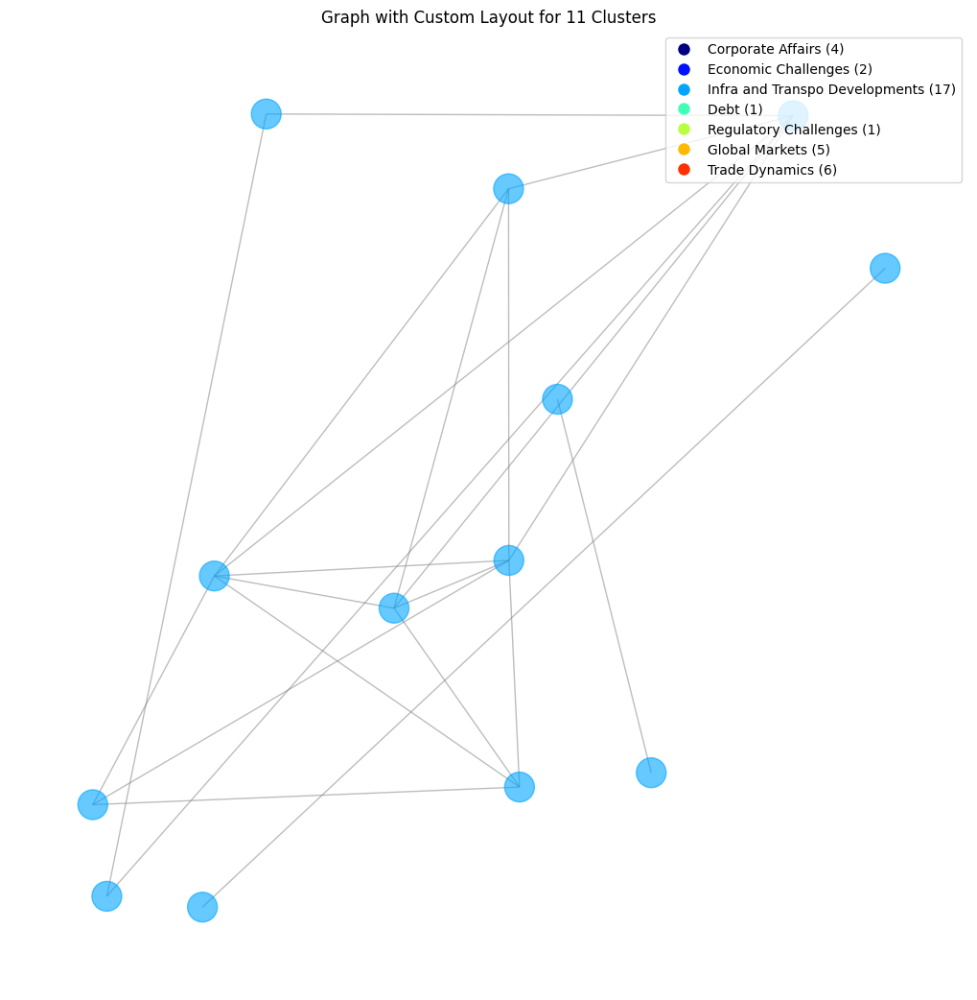

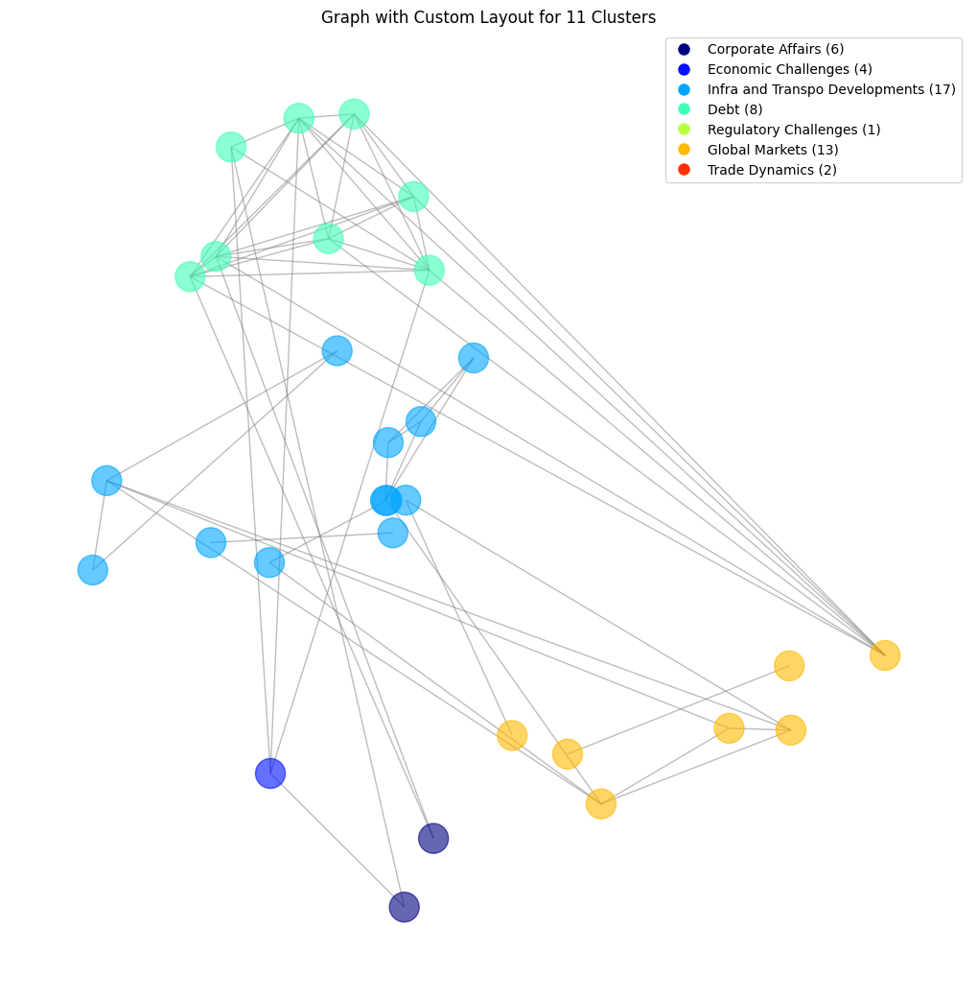

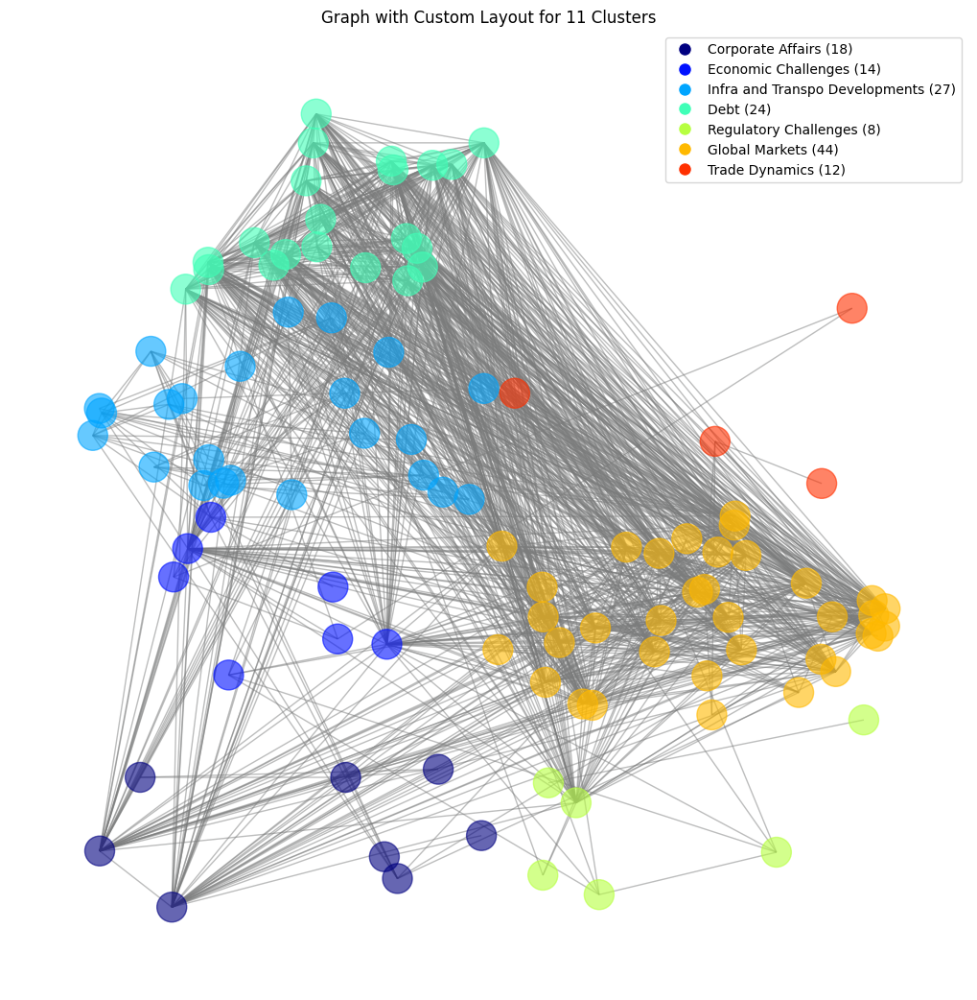

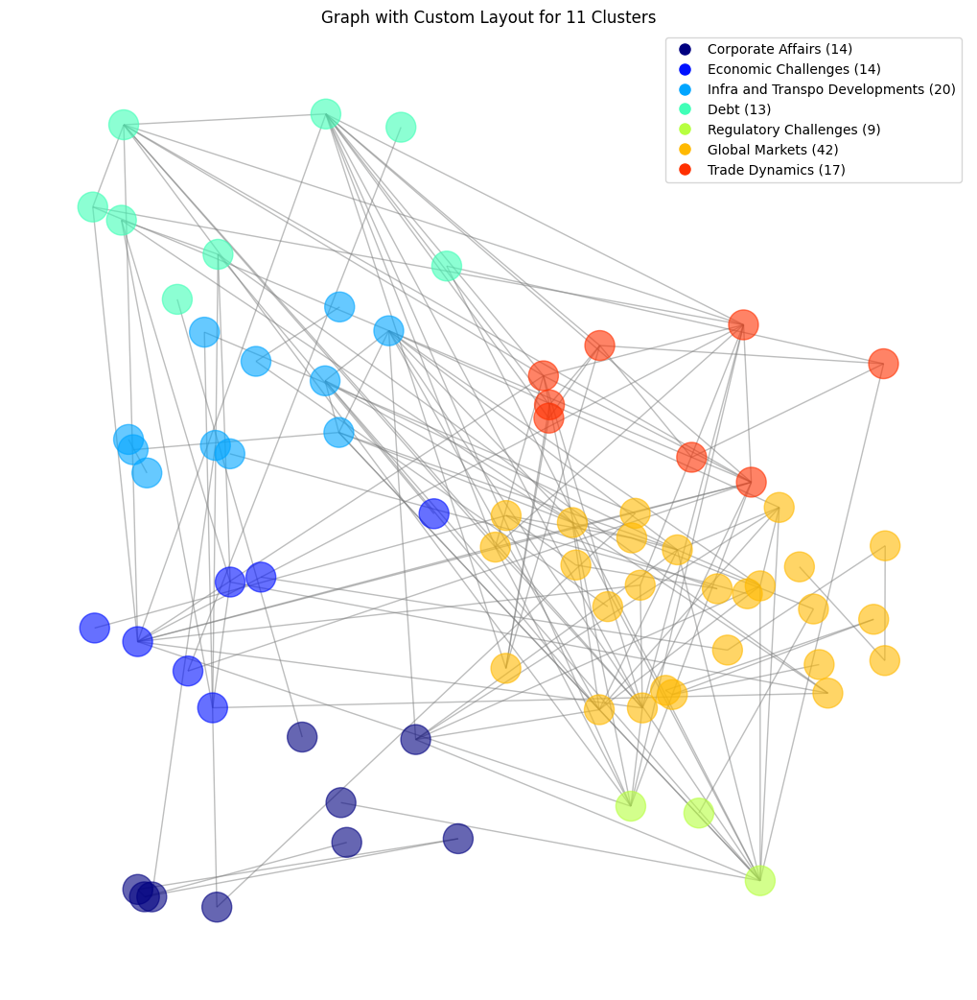

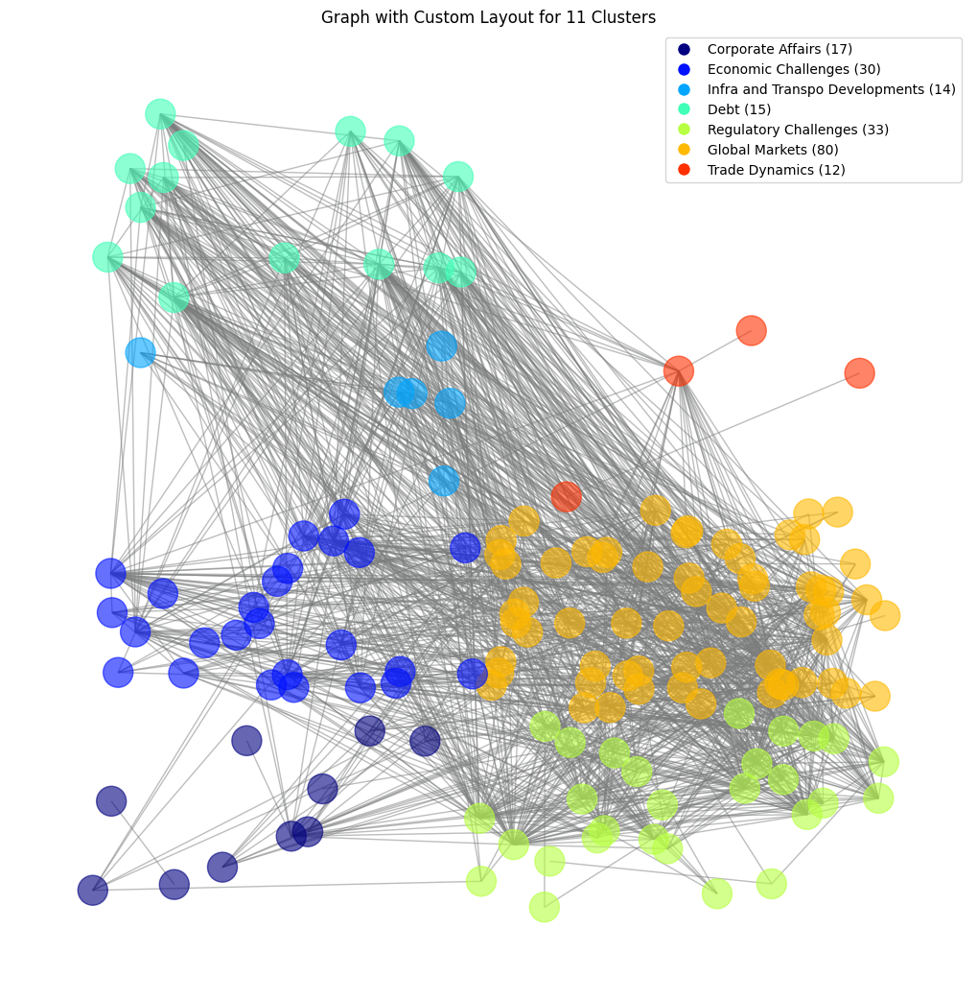

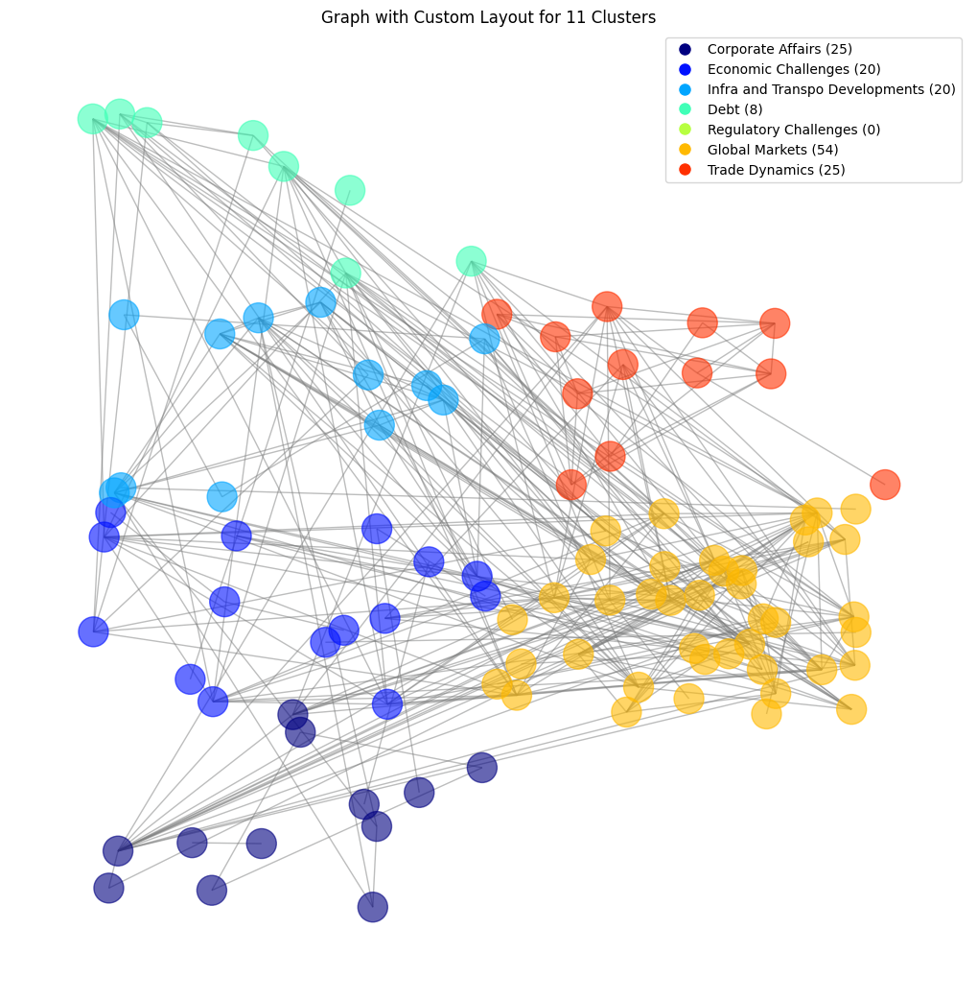

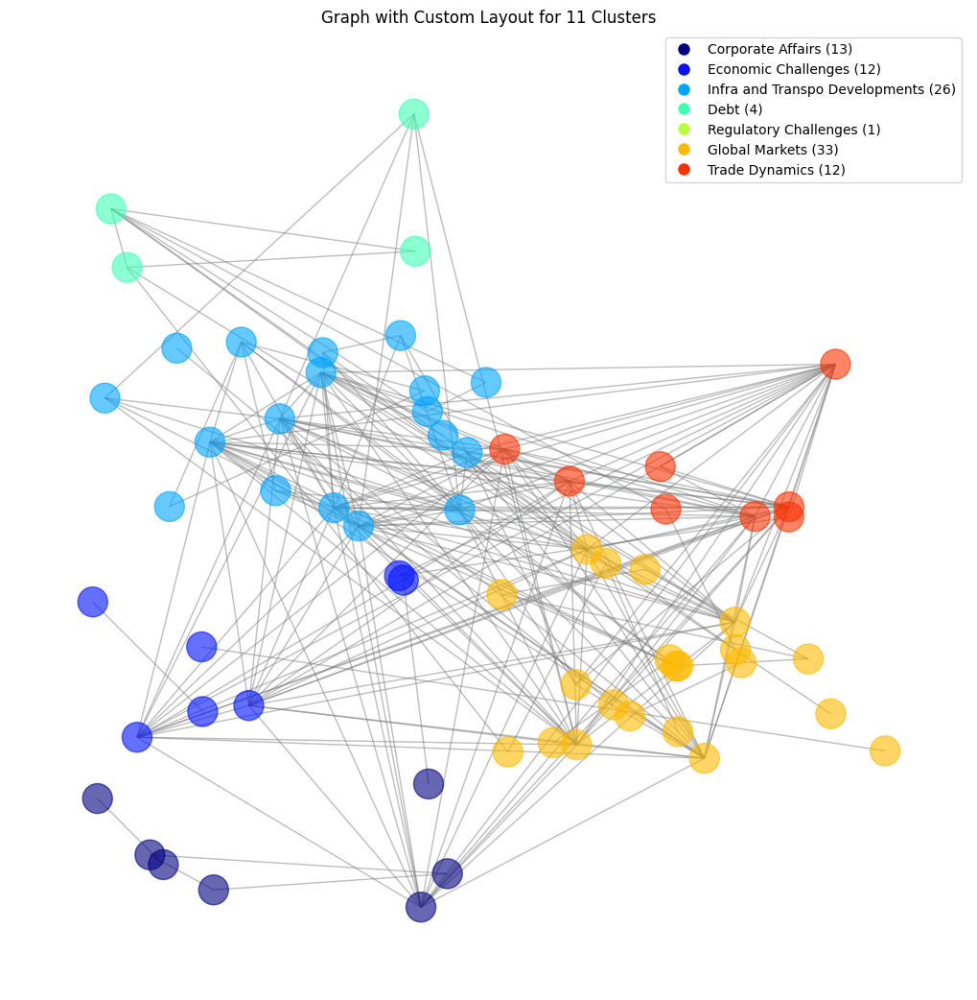

In [18]:
for i in df_final.month.unique():
    plot_network(m=i)

In [19]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import calendar

def plot_network(m):
    m_map = {('0'+str(i) if len(str(i))==1 else str(i)):j for i, j in zip(range(1,13), list(calendar.month_name)[1:])}
    m_df = df_final[df_final.month == m]
    labels = pd.Series(df_final.topic.values,index=df_final.id).to_dict()

    # Create a complete list of all unique topics from the dataset
    all_topics = set(df_final.topic.unique())

    # Update topic_counts to include all topics
    topic_counts = {topic: 0 for topic in all_topics}
    for topic, count in m_df.topic.value_counts().items():
        topic_counts[topic] = count

    # Create a sample graph (replace this with your graph)
    article_projection = nx.bipartite.projected_graph(B, article_nodes)
    article_projection.remove_nodes_from(df_final[df_final.month != m].id.tolist())
    article_projection.remove_nodes_from(list(nx.isolates(article_projection)))

    pos = custom_layout(article_projection, labels)

    # Set node colors based on external cluster labels
    unique_labels = list(set(labels.values()))
    color_map = {label: plt.cm.jet(i/len(unique_labels)) for i, label in enumerate(unique_labels)}
    node_colors = [(*color_map[labels[node]][:3], 0.6) for node in article_projection.nodes()]
    print(color_map)

    # Create a figure with custom gridspec
    fig = plt.figure(figsize=(16*2, 9*2))
    gs = gridspec.GridSpec(1, 2, width_ratios=[2, 1])

    # Plot the network on the left side
    ax0 = plt.subplot(gs[0])
    nx.draw(article_projection, pos, node_color=node_colors, edge_color=(0.4823529411764706, 0.48627450980392156, 0.48627450980392156,0.5), node_size=500, ax=ax0)
    ax0.set_title(f"Changes in Article Topics Over Time ({m_map[m[-2:]]} {m[:4]})", fontsize=35)

    # Plot the horizontal bar chart on the right side
    ax1 = plt.subplot(gs[1])

    # Sort topics alphabetically
    sorted_topics = sorted(topic_counts.keys())
    sorted_counts = [topic_counts[topic] for topic in sorted_topics]

    ax1.barh([i.upper() for i in sorted_topics], sorted_counts, color=[color_map[topic] for topic in sorted_topics])
    ax1.set_title('Count of Articles per Topic Over Time', fontsize=30)
    ax1.set_xlim(0, 100)

    # Identify the topic with the highest count
    max_topic = max(topic_counts, key=topic_counts.get).upper()

    # Create a list of font weights
    font_weights = ['bold' if topic.upper() == max_topic else 'normal' for topic in sorted_topics]

    # Apply font weights to y-tick labels
    labels = [i.upper() for i in sorted_topics]
    ax1.set_yticks(range(len(labels)))
    y_tick_labels = ax1.set_yticklabels(labels)

    # Set individual font weights for each y-tick label
    for i, label in enumerate(y_tick_labels):
        label.set_fontweight(font_weights[i])

    ax1.invert_yaxis()

    # Remove the border of the bar plot
    for spine in ax1.spines.values():
        spine.set_visible(False)

    # Change the size of the y-axis ticks to 15
    ax1.tick_params(axis='y', labelsize=20)
    ax1.tick_params(axis='x', labelsize=20)

    plt.tight_layout()
    plt.savefig(f'images/topic-timeline-{m}.png', dpi=200)
    plt.show()



{'Corporate Affairs': (0.0, 0.0, 0.5, 1.0), 'Economic Challenges': (0.0, 0.06470588235294118, 1.0, 1.0), 'Infra and Transpo Developments': (0.0, 0.6450980392156863, 1.0, 1.0), 'Debt': (0.24984187223276405, 1.0, 0.717900063251107, 1.0), 'Regulatory Challenges': (0.7179000632511068, 1.0, 0.2498418722327641, 1.0), 'Global Markets': (1.0, 0.7269426289034134, 0.0, 1.0), 'Trade Dynamics': (1.0, 0.18954248366013093, 0.0, 1.0)}


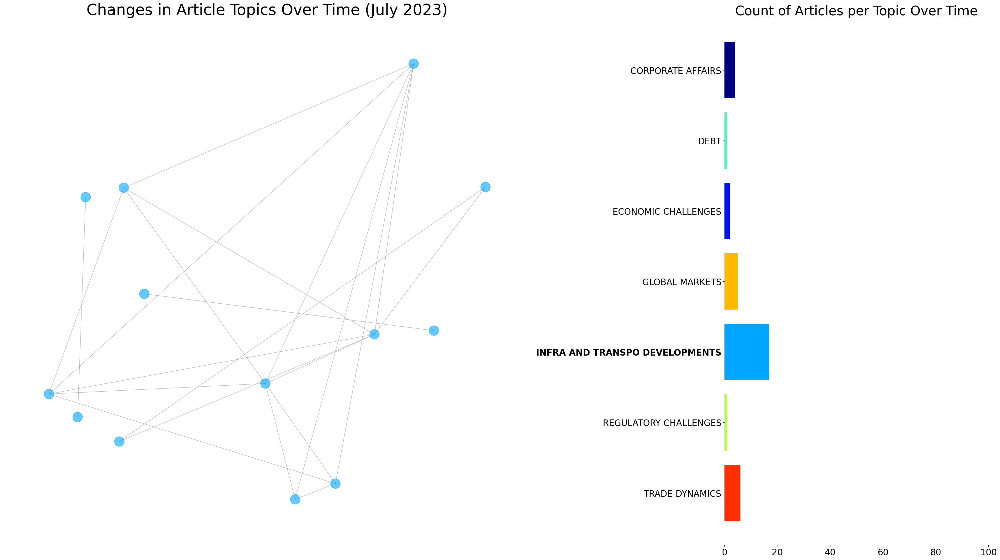

{'Corporate Affairs': (0.0, 0.0, 0.5, 1.0), 'Economic Challenges': (0.0, 0.06470588235294118, 1.0, 1.0), 'Infra and Transpo Developments': (0.0, 0.6450980392156863, 1.0, 1.0), 'Debt': (0.24984187223276405, 1.0, 0.717900063251107, 1.0), 'Regulatory Challenges': (0.7179000632511068, 1.0, 0.2498418722327641, 1.0), 'Global Markets': (1.0, 0.7269426289034134, 0.0, 1.0), 'Trade Dynamics': (1.0, 0.18954248366013093, 0.0, 1.0)}


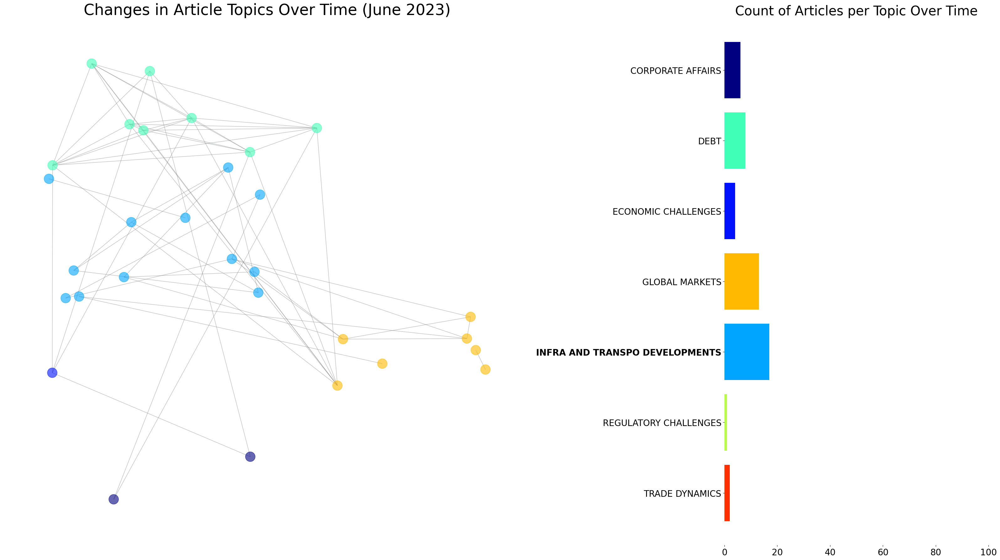

{'Corporate Affairs': (0.0, 0.0, 0.5, 1.0), 'Economic Challenges': (0.0, 0.06470588235294118, 1.0, 1.0), 'Infra and Transpo Developments': (0.0, 0.6450980392156863, 1.0, 1.0), 'Debt': (0.24984187223276405, 1.0, 0.717900063251107, 1.0), 'Regulatory Challenges': (0.7179000632511068, 1.0, 0.2498418722327641, 1.0), 'Global Markets': (1.0, 0.7269426289034134, 0.0, 1.0), 'Trade Dynamics': (1.0, 0.18954248366013093, 0.0, 1.0)}


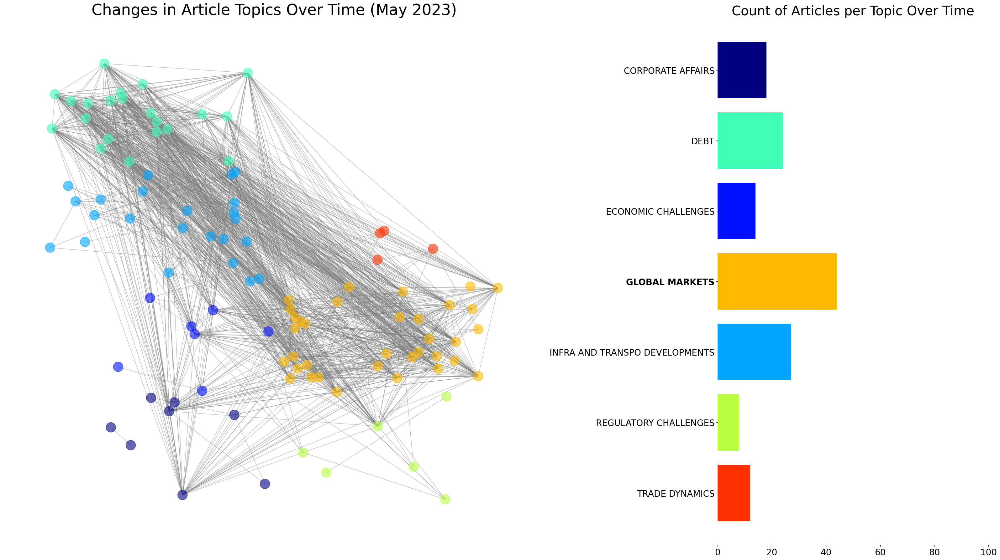

{'Corporate Affairs': (0.0, 0.0, 0.5, 1.0), 'Economic Challenges': (0.0, 0.06470588235294118, 1.0, 1.0), 'Infra and Transpo Developments': (0.0, 0.6450980392156863, 1.0, 1.0), 'Debt': (0.24984187223276405, 1.0, 0.717900063251107, 1.0), 'Regulatory Challenges': (0.7179000632511068, 1.0, 0.2498418722327641, 1.0), 'Global Markets': (1.0, 0.7269426289034134, 0.0, 1.0), 'Trade Dynamics': (1.0, 0.18954248366013093, 0.0, 1.0)}


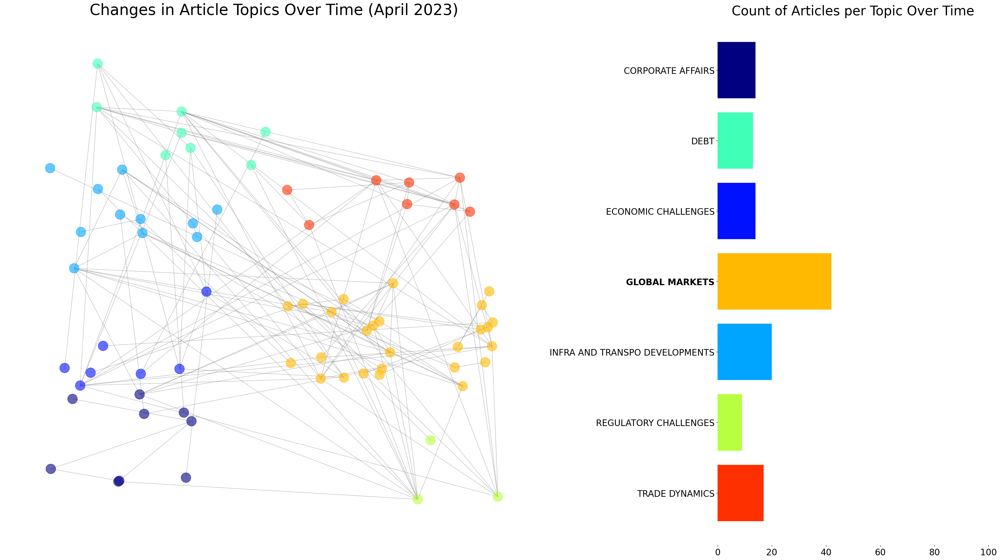

{'Corporate Affairs': (0.0, 0.0, 0.5, 1.0), 'Economic Challenges': (0.0, 0.06470588235294118, 1.0, 1.0), 'Infra and Transpo Developments': (0.0, 0.6450980392156863, 1.0, 1.0), 'Debt': (0.24984187223276405, 1.0, 0.717900063251107, 1.0), 'Regulatory Challenges': (0.7179000632511068, 1.0, 0.2498418722327641, 1.0), 'Global Markets': (1.0, 0.7269426289034134, 0.0, 1.0), 'Trade Dynamics': (1.0, 0.18954248366013093, 0.0, 1.0)}


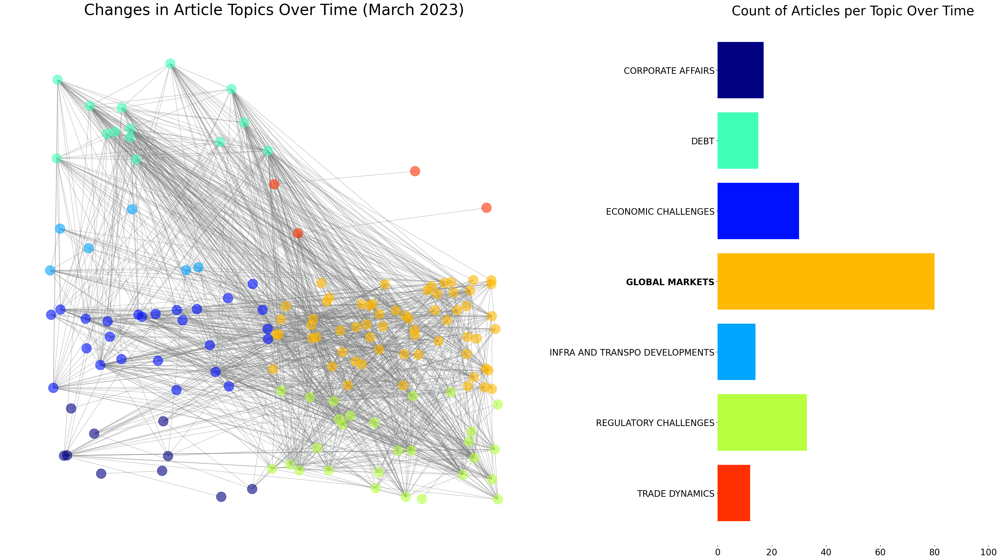

{'Corporate Affairs': (0.0, 0.0, 0.5, 1.0), 'Economic Challenges': (0.0, 0.06470588235294118, 1.0, 1.0), 'Infra and Transpo Developments': (0.0, 0.6450980392156863, 1.0, 1.0), 'Debt': (0.24984187223276405, 1.0, 0.717900063251107, 1.0), 'Regulatory Challenges': (0.7179000632511068, 1.0, 0.2498418722327641, 1.0), 'Global Markets': (1.0, 0.7269426289034134, 0.0, 1.0), 'Trade Dynamics': (1.0, 0.18954248366013093, 0.0, 1.0)}


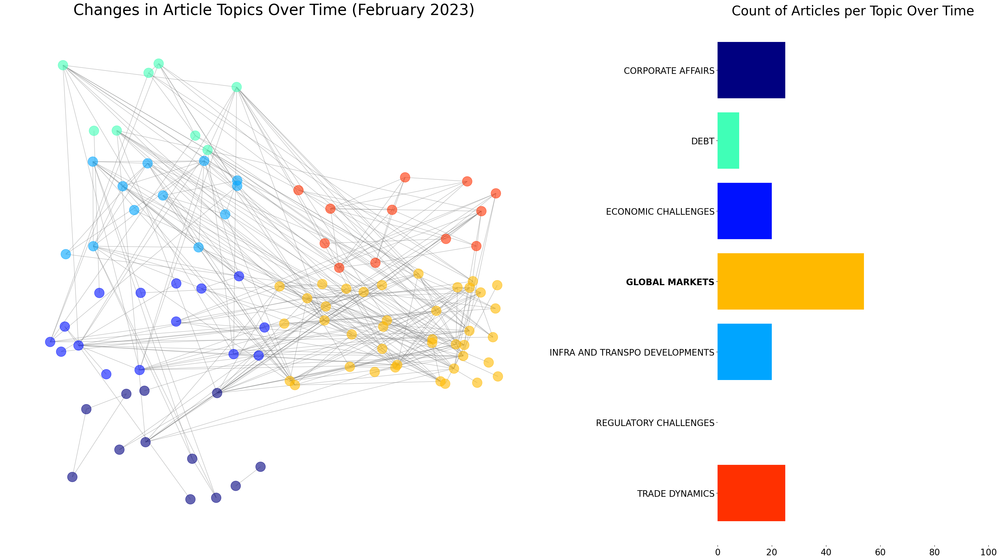

{'Corporate Affairs': (0.0, 0.0, 0.5, 1.0), 'Economic Challenges': (0.0, 0.06470588235294118, 1.0, 1.0), 'Infra and Transpo Developments': (0.0, 0.6450980392156863, 1.0, 1.0), 'Debt': (0.24984187223276405, 1.0, 0.717900063251107, 1.0), 'Regulatory Challenges': (0.7179000632511068, 1.0, 0.2498418722327641, 1.0), 'Global Markets': (1.0, 0.7269426289034134, 0.0, 1.0), 'Trade Dynamics': (1.0, 0.18954248366013093, 0.0, 1.0)}


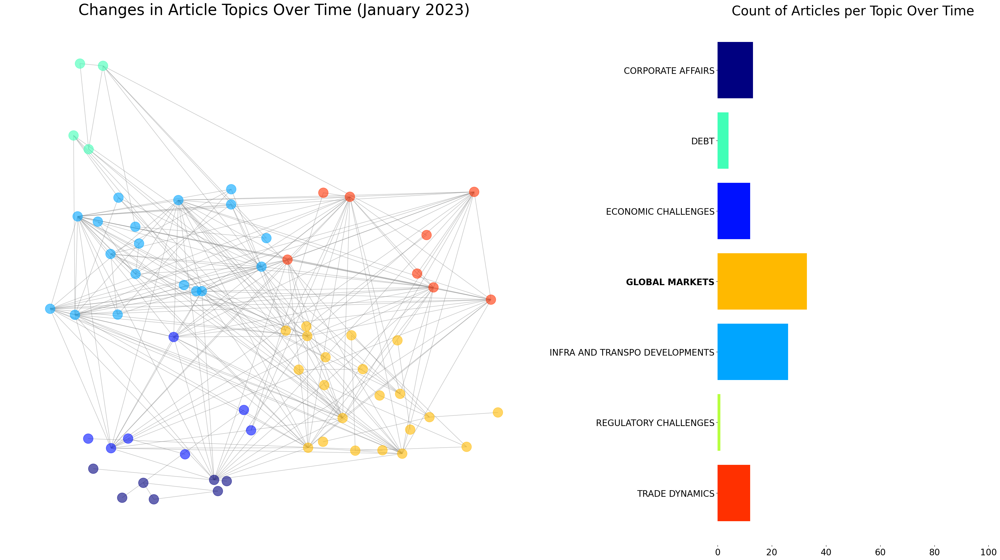

In [20]:
for i in df_final.month.unique():
    plot_network(m=i)

In [21]:
topic_counts = df_final.topic.value_counts().to_dict()
sorted(topic_counts.keys(), key=lambda x: topic_counts[x], reverse=True)

['Global Markets',
 'Infra and Transpo Developments',
 'Corporate Affairs',
 'Economic Challenges',
 'Trade Dynamics',
 'Debt',
 'Regulatory Challenges']

In [22]:
[i.upper() for i in sorted(topic_counts.keys(), key=lambda x: topic_counts[x], reverse=True)]

['GLOBAL MARKETS',
 'INFRA AND TRANSPO DEVELOPMENTS',
 'CORPORATE AFFAIRS',
 'ECONOMIC CHALLENGES',
 'TRADE DYNAMICS',
 'DEBT',
 'REGULATORY CHALLENGES']

{'Corporate Affairs': (0.0, 0.0, 0.5, 1.0), 'Economic Challenges': (0.0, 0.06470588235294118, 1.0, 1.0), 'Infra and Transpo Developments': (0.0, 0.6450980392156863, 1.0, 1.0), 'Debt': (0.24984187223276405, 1.0, 0.717900063251107, 1.0), 'Regulatory Challenges': (0.7179000632511068, 1.0, 0.2498418722327641, 1.0), 'Global Markets': (1.0, 0.7269426289034134, 0.0, 1.0), 'Trade Dynamics': (1.0, 0.18954248366013093, 0.0, 1.0)}


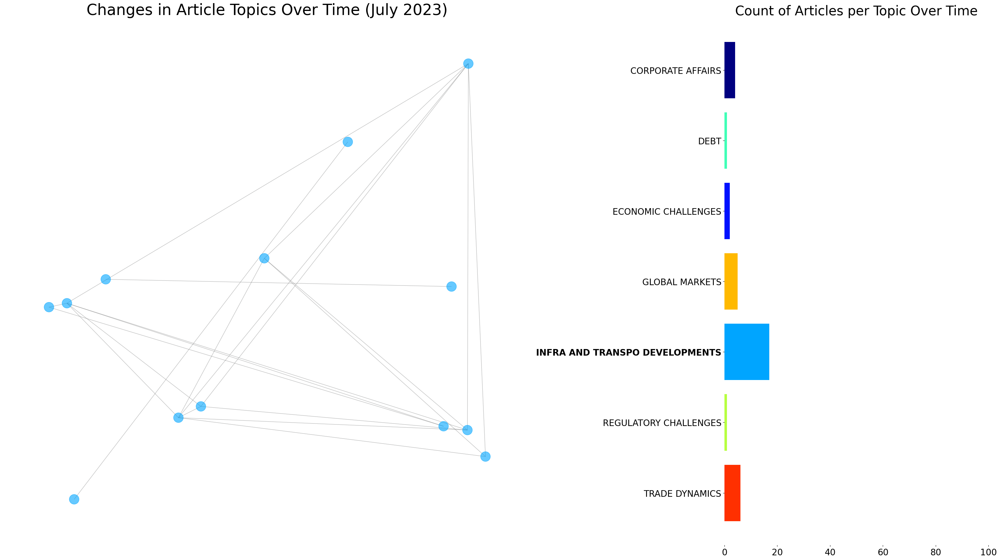

In [23]:
for i in df_final.month.unique()[:1]:
    plot_network(m=i)

In [25]:
topic_label_map

{'russian_ukraine_war': 'Infra and Transpo Developments',
 'global_market': 'Global Markets',
 'ph_gdp': 'Trade Dynamics',
 'uk_bugdet_unemployment': 'Corporate Affairs',
 'inflation': 'Economic Challenges',
 'others': 'Debt',
 'ph_marcos_jr': 'Regulatory Challenges'}

In [27]:
color_map = {'Infra and Transpo Developments': (1.0, 0.6688453159041396, 0.0, 1.0), 
             'Global Markets': (1.0, 0.33478576615831535, 0.0, 1.0), 
             'Trade Dynamics': (0.0, 0.5823529411764706, 1.0, 1.0), 
             'Corporate Affairs': (0.6293485135989879, 1.0, 0.338393421884883, 1.0), 
             'Economic Challenges': (0.0, 0.22156862745098038, 1.0, 1.0), 
            #  'others': (0.0, 0.0, 0.5, 1.0), 
             'Regulatory Challenges': (0.9099821746880573, 0.0007262164124910431, 0.0, 1.0), 
             'Debt': (0.3383934218848829, 1.0, 0.629348513598988, 1.0), 
            #  'ph_marcos_jr': (0.04743833017077798, 0.9588235294117647, 0.920303605313093, 1.0), 
            #  'airlines': (0.9203036053130929, 1.0, 0.04743833017077803, 1.0), 
            #  'fuel_oil_market': (0.5058823529411764, 0.5215686274509804, 0.5372549019607843, 1.0)
            }

In [29]:
# 1. Create a table for nodes (topic clusters)
_nodes = df_final['topic'].unique()

# 2. Create a table for edges (number of unique similar/shared entities)
_edges = []
for i in range(len(_nodes)):
    for j in range(i+1, len(_nodes)):
        topic1 = _nodes[i]
        topic2 = _nodes[j]
        
        # Get entities for each topic
#         entities_topic1 = df_final[df_final['topic'] == topic1]['unique_entities'].explode().unique()
#         entities_topic2 = df_final[df_final['topic'] == topic2]['unique_entities'].explode().unique()
        entities_topic1 = list(set([e for sublist in df_final[df_final['topic'] == topic1]['unique_entities']
                                    for e in sublist]))
        entities_topic2 = list(set([e for sublist in df_final[df_final['topic'] == topic2]['unique_entities']
                                    for e in sublist]))
        
        # Find common entities
        common_entities = len(set(entities_topic1).intersection(entities_topic2))
        
        if common_entities > 0:
            _edges.append((topic1, topic2, common_entities))

# Convert edges list to DataFrame
edges_df = pd.DataFrame(_edges, columns=['topic1', 'topic2', 'shared_entities_count'])

print("Nodes:")
print(_nodes)
print("\nEdges:")
print(edges_df)


Nodes:
['Infra and Transpo Developments' 'Global Markets' 'Trade Dynamics'
 'Corporate Affairs' 'Economic Challenges' 'Debt' 'Regulatory Challenges']

Edges:
                            topic1                 topic2  \
0   Infra and Transpo Developments         Global Markets   
1   Infra and Transpo Developments         Trade Dynamics   
2   Infra and Transpo Developments      Corporate Affairs   
3   Infra and Transpo Developments    Economic Challenges   
4   Infra and Transpo Developments                   Debt   
5   Infra and Transpo Developments  Regulatory Challenges   
6                   Global Markets         Trade Dynamics   
7                   Global Markets      Corporate Affairs   
8                   Global Markets    Economic Challenges   
9                   Global Markets                   Debt   
10                  Global Markets  Regulatory Challenges   
11                  Trade Dynamics      Corporate Affairs   
12                  Trade Dynamics    Economic Ch

In [30]:
edges_df

,topic1,topic2,shared_entities_count
0,Infra and Transpo Developments,Global Markets,36
1,Infra and Transpo Developments,Trade Dynamics,7
2,Infra and Transpo Developments,Corporate Affairs,25
3,Infra and Transpo Developments,Economic Challenges,13
4,Infra and Transpo Developments,Debt,6
5,Infra and Transpo Developments,Regulatory Challenges,12
6,Global Markets,Trade Dynamics,26
7,Global Markets,Corporate Affairs,22
8,Global Markets,Economic Challenges,54
9,Global Markets,Debt,47


In [35]:
'Trade Dynamics'.replace(' ','\n')

'Trade\nDynamics'

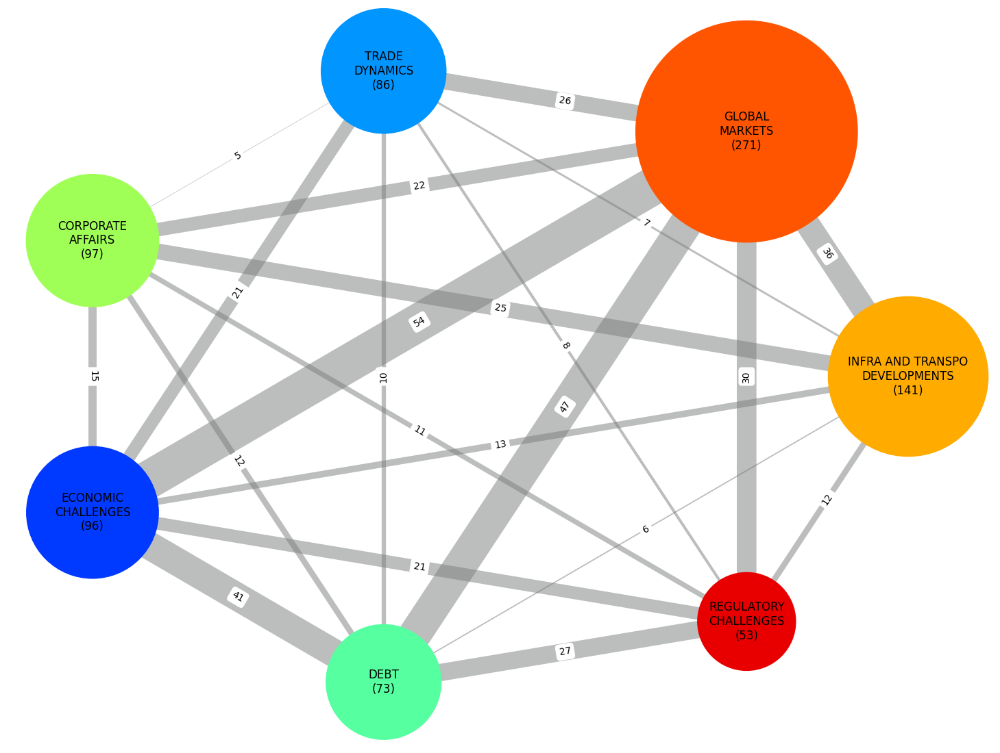

In [39]:
import networkx as nx
import matplotlib.pyplot as plt

# 1. Create a graph object
G = nx.Graph()

# 2. Add nodes and edges to the graph
G.add_nodes_from(_nodes)
G.add_weighted_edges_from(_edges)

# 3. Define node colors, edge weights, and node sizes
node_colors = [color_map[node] for node in G.nodes()]
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
node_sizes = [df_final[df_final['topic'] == node].shape[0] * 200 for node in G.nodes()]  # Multiplied by 100 for better visualization

# Determine the minimum and maximum edge weights
min_weight = min(edge_weights)
max_weight = max(edge_weights)

# Define the desired range for the scaled weights
min_scale = 0.5
max_scale = 40

# Apply the Min-Max scaling formula
scaled_weights = [(w - min_weight) / (max_weight - min_weight) * (max_scale - min_scale) + min_scale for w in edge_weights]

# Modify node labels to include article count
labels = {}
for node in G.nodes():
    article_count = df_final[df_final['topic'] == node].shape[0]
    if len(node.split()) == 2:
        new_node = node.upper().replace(' ', '\n')
        labels[node] = f"{new_node}\n({article_count})"
    else:
        new_node = node.upper().replace('O D', 'O\nD')
        labels[node] = f"{new_node}\n({article_count})"

# 4. Draw the graph
plt.figure(figsize=(12*1.2, 9*1.2))
pos = nx.circular_layout(G)
nx.draw(G, pos, with_labels=True, labels=labels, node_color=node_colors,
        edge_color=(0.4823529411764706, 0.48627450980392156, 0.48627450980392156,0.5), width=scaled_weights, node_size=node_sizes, font_size=12)
# plt.title("Topic Network")
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.tight_layout()
plt.savefig(f'images/topic-network.png', dpi=200, bbox_inches='tight')
plt.show()


## Topics Bar Chart

In [ ]:
unique_topics = df_final.topic.unique()

In [ ]:
unique_topics

array(['russian_ukraine_war', 'global_market', 'ph_gdp',
       'uk_bugdet_unemployment', 'inflation', 'others', 'ph_marcos_jr'],
      dtype=object)

In [ ]:
topic_label_map = dict(zip(
    unique_topics.tolist(),
    [
        'Russia-Ukraine War', 'Global Market', 'PH GDP',
        'UK Budget Unemployment', 'Inflation', 'Others',
        'PH Marcos Jr.'
    ]
))

In [ ]:
import matplotlib.pyplot as plt

# Your existing code
df_final = df_final.explode('unique_entities')
grouped_data = df_final.groupby('topic').unique_entities.nunique().sort_values()

# Plotting
fig, ax = plt.subplots()
bars = grouped_data.plot.barh(ax=ax)

# Set labels and ticks
plt.xlabel('Number of Unique Entities')
plt.ylabel('Topic')
ax.set_yticklabels([topic_label_map[txt.get_text()] for txt in ax.get_yticklabels()])

# Add bar values at the end of each bar
for bar in bars.containers:
    ax.bar_label(bar, fmt='%d', label_type='edge', fontsize=8)

# Save the plot
plt.savefig('images/topics-bar-chart-by-unique-entities.png', dpi=200)
plt.show()


In [ ]:
df_final.unique_entities

0      Eric Peter Roxas
0       Rodrigo Duterte
1        Edgar Galvante
1       Rodrigo Duterte
2           Ben Jeffery
             ...       
815      Jaime Bautista
816      Jaime Bautista
816     Bongbong Marcos
816       Manuel Tamayo
816        Cesar Chiong
Name: unique_entities, Length: 3476, dtype: object

In [ ]:
(
    df_final
    # .explode('unique_entities')
    .groupby('topic')
    .size()
    .sort_values()
)

topic
ph_marcos_jr               250
ph_gdp                     334
others                     340
uk_bugdet_unemployment     356
inflation                  405
russian_ukraine_war        666
global_market             1125
dtype: int64

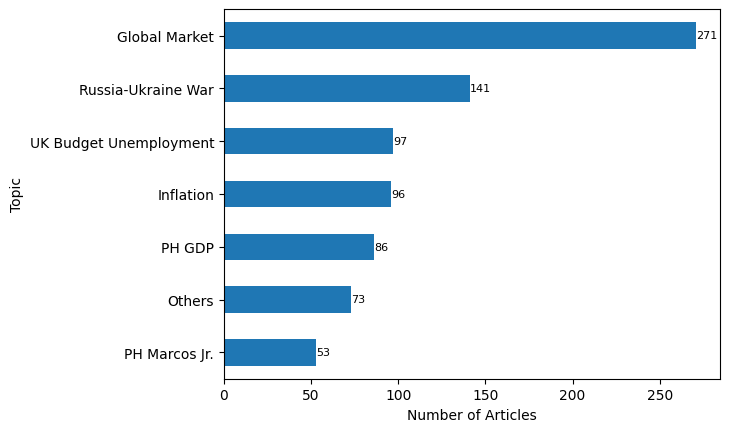

In [ ]:
import matplotlib.pyplot as plt

# Your existing code
df_final_grouped = df_final.groupby('topic').size().sort_values()

# Plotting
fig, ax = plt.subplots()
bars = df_final_grouped.plot.barh(ax=ax)

# Set labels and ticks
plt.xlabel('Number of Articles')
plt.ylabel('Topic')
ax.set_yticklabels([topic_label_map[txt.get_text()] for txt in ax.get_yticklabels()])

# Add bar values at the end of each bar
for bar in bars.containers:
    ax.bar_label(bar, fmt='%d', label_type='edge', fontsize=8)

# Save the plot
plt.savefig('images/topics-bar-chart-by-articles.png', dpi=200)
plt.show()


In [ ]:
(
    df_final
    .explode('unique_entities')
    .groupby('topic')
    .unique_entities
    .nunique()
    .sort_values()
).plot.barh()
plt.gca().set_yticklabels(
    [topic_label_map[txt.get_text()] for txt in plt.gca().get_yticklabels()]
)

plt.xlabel('Number of Unique Entities')
plt.ylabel('Topic')

plt.savefig('images/topics-bar-chart-by-articles.png', dpi=200)

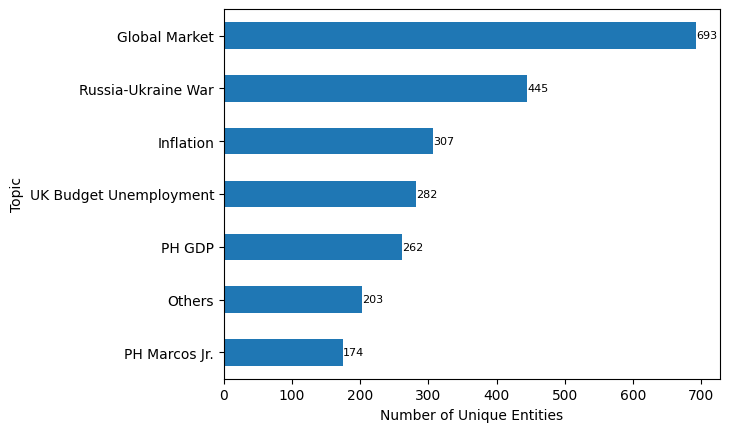

In [ ]:
import matplotlib.pyplot as plt

# Your existing code
df_final = df_final.explode('unique_entities')
grouped_data = df_final.groupby('topic').unique_entities.nunique().sort_values()

# Plotting
fig, ax = plt.subplots()
bars = grouped_data.plot.barh(ax=ax)

# Set labels and ticks
plt.xlabel('Number of Unique Entities')
plt.ylabel('Topic')
ax.set_yticklabels([topic_label_map[txt.get_text()] for txt in ax.get_yticklabels()])

# Add bar values at the end of each bar
for bar in bars.containers:
    ax.bar_label(bar, fmt='%d', label_type='edge', fontsize=8)

# Save the plot
plt.savefig('images/topics-bar-chart-by-unique-entities.png', dpi=200)
plt.show()


In [ ]:


plt.figure(figsize=(16*0.75, 9*0.75))
for topic in unique_topics:
    df_filtered = df_final[df_final.topic == topic]
    unique_entities_count = (
        df_filtered
        .set_index('date')
        .unique_entities
        .explode()
        .resample('M')
        .nunique()
    )

<Figure size 1200x675 with 0 Axes>

# Topics Timeline

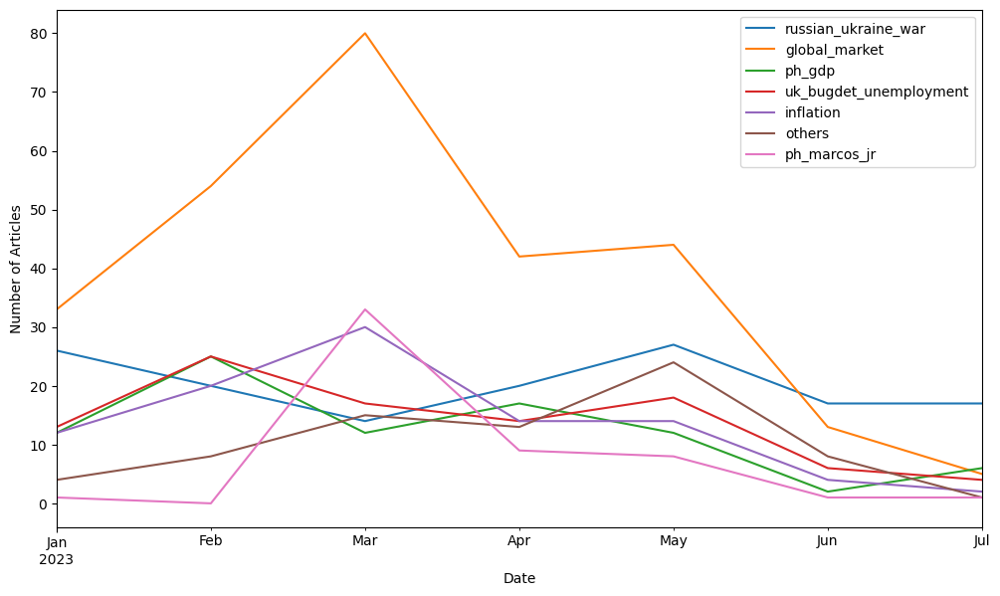

In [ ]:
unique_topics = df_final.topic.unique()

plt.figure(figsize=(16*0.75, 9*0.75))
for topic in unique_topics:
    df_filtered = df_final[df_final.topic == topic]
    unique_articles_count = (
        df_filtered.set_index('date').resample('M').size()
    )
    unique_articles_count.plot(label=topic)
    plt.xlabel('Date')
    plt.ylabel('Number of Articles')
    
    plt.legend(loc='best')
    # line_color = plt.gca().lines[-1].get_color()

    # # Find the index of the maximum value (peak)
    # peak_index = unique_entities_count.idxmax()#np.random.choice(unique_entities_count.argsort()[::-1][:3])
    # peak_value = unique_entities_count.max()

    # # Annotate near the peak with the topic label using the same color as the line
    # if topic in ['ph_gdp', 'inflation']:
    #     y_offset = 5
    # elif topic in ['uk_bugdet_unemployment', 'ph_marcos_jr']:
    #     y_offset = -5
    # else:
    #     y_offset = 0
    # plt.annotate(topic, xy=(peak_index, peak_value),
    #              xytext=(5, y_offset),
    #              textcoords='offset points',
    #              color=line_color,
    #              fontsize=10)

plt.savefig('images/topic-timeline-articles.png', dpi=200)

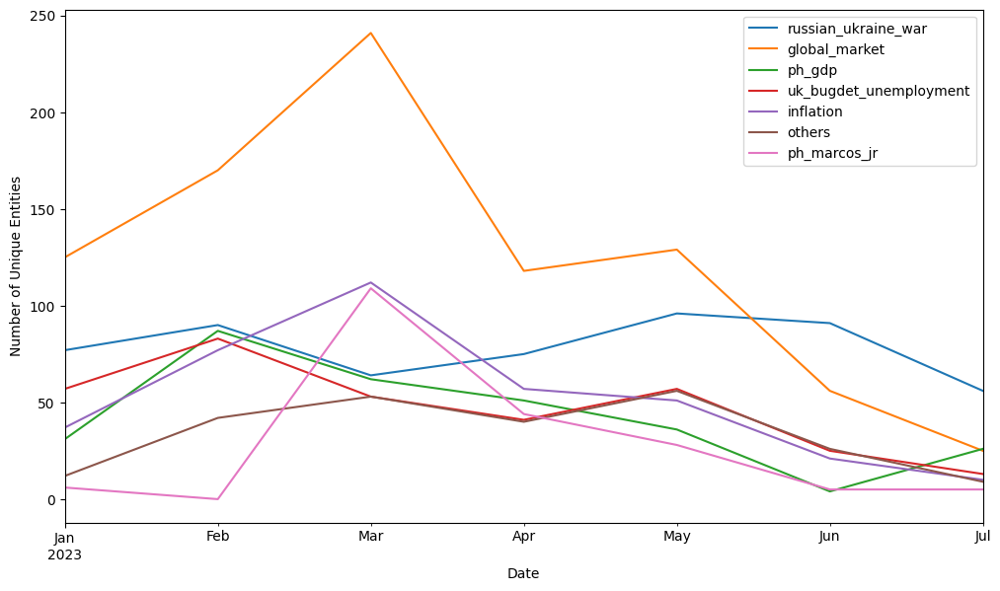

In [ ]:
unique_topics = df_final.topic.unique()

plt.figure(figsize=(16*0.75, 9*0.75))
for topic in unique_topics:
    df_filtered = df_final[df_final.topic == topic]
    unique_entities_count = (
        df_filtered
        .set_index('date')
        .unique_entities
        .explode()
        .resample('M')
        .nunique()
        
    )
    unique_entities_count.plot(label=topic)
    plt.xlabel('Date')
    plt.ylabel('Number of Unique Entities')
    
    plt.legend(loc='best')
    # line_color = plt.gca().lines[-1].get_color()

    # # Find the index of the maximum value (peak)
    # peak_index = unique_entities_count.idxmax()#np.random.choice(unique_entities_count.argsort()[::-1][:3])
    # peak_value = unique_entities_count.max()

    # # Annotate near the peak with the topic label using the same color as the line
    # if topic in ['ph_gdp', 'inflation']:
    #     y_offset = 5
    # elif topic in ['uk_bugdet_unemployment', 'ph_marcos_jr']:
    #     y_offset = -5
    # else:
    #     y_offset = 0
    # plt.annotate(topic, xy=(peak_index, peak_value),
    #              xytext=(5, y_offset),
    #              textcoords='offset points',
    #              color=line_color,
    #              fontsize=10)

plt.savefig('images/topic-timeline.png', dpi=200)